Filename: MM 9.jpg
Shape: (7500,)
Dimension: 1
Filename: MM 1.jpg
Shape: (7500,)
Dimension: 1
Filename: MM 10.jpg
Shape: (7500,)
Dimension: 1
Filename: MM 2.jpg
Shape: (7500,)
Dimension: 1
Filename: MM 3.jpg
Shape: (7500,)
Dimension: 1
Filename: MM 4.jpg
Shape: (7500,)
Dimension: 1
Filename: MM 6.jpg
Shape: (7500,)
Dimension: 1
Filename: MM 5.jpg
Shape: (7500,)
Dimension: 1
Filename: MM 7.jpg
Shape: (7500,)
Dimension: 1
Filename: MM 8.jpg
Shape: (7500,)
Dimension: 1
Filename: MB 1.jpg
Shape: (7500,)
Dimension: 1
Filename: MB 10.jpg
Shape: (7500,)
Dimension: 1
Filename: MB 2.jpg
Shape: (7500,)
Dimension: 1
Filename: MB 3.jpg
Shape: (7500,)
Dimension: 1
Filename: MB 4.jpg
Shape: (7500,)
Dimension: 1
Filename: MB 5.jpg
Shape: (7500,)
Dimension: 1
Filename: MB 6.jpg
Shape: (7500,)
Dimension: 1
Filename: MB 7.jpg
Shape: (7500,)
Dimension: 1
Filename: MB 8.jpg
Shape: (7500,)
Dimension: 1
Filename: MB 9.jpg
Shape: (7500,)
Dimension: 1


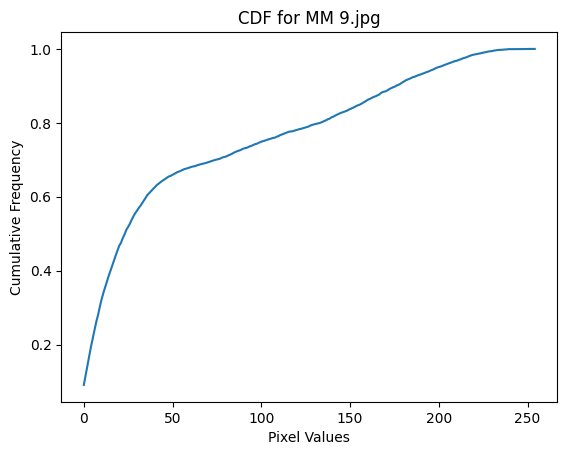

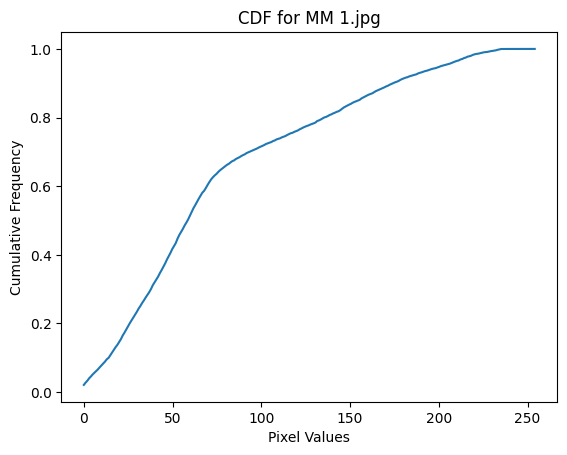

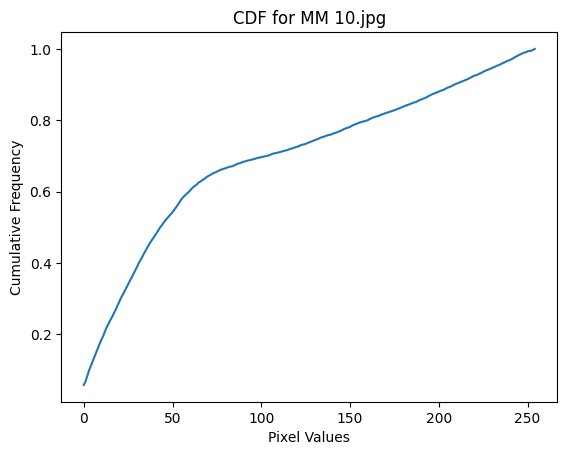

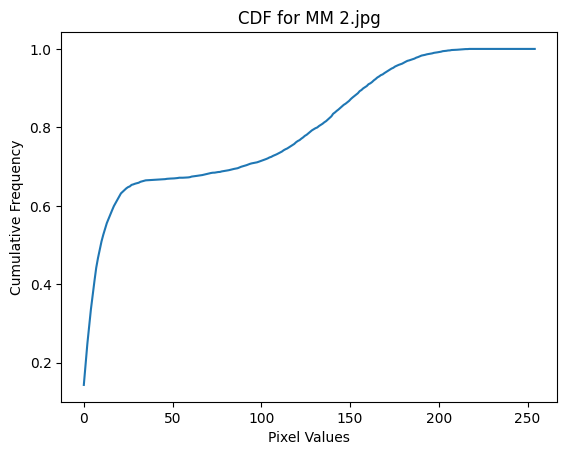

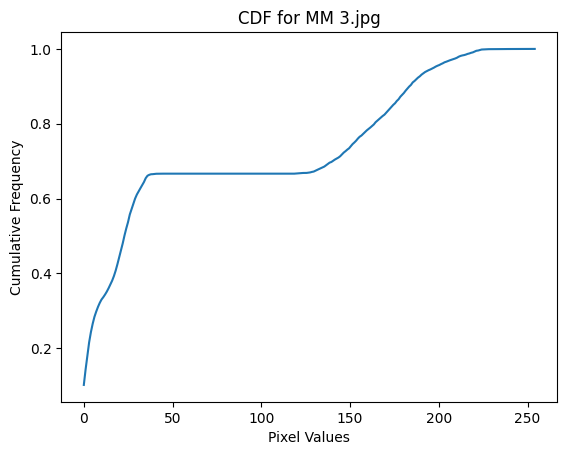

...

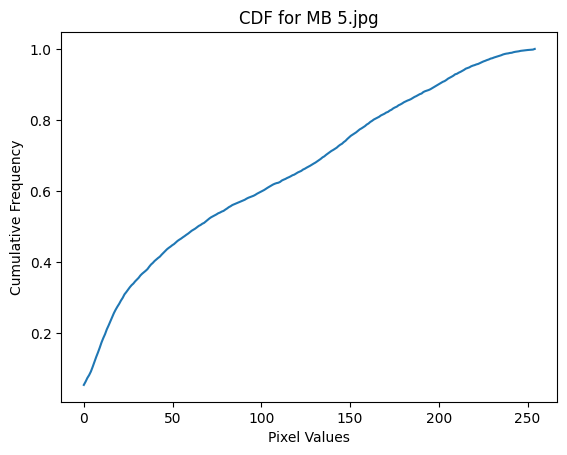

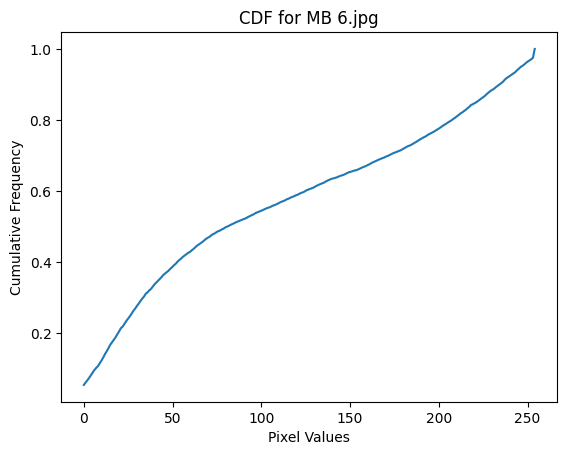

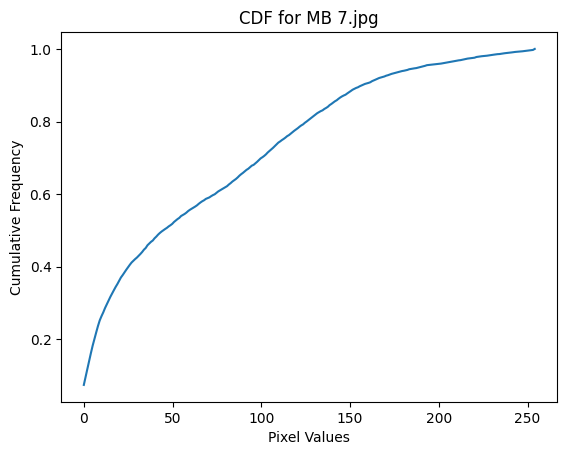

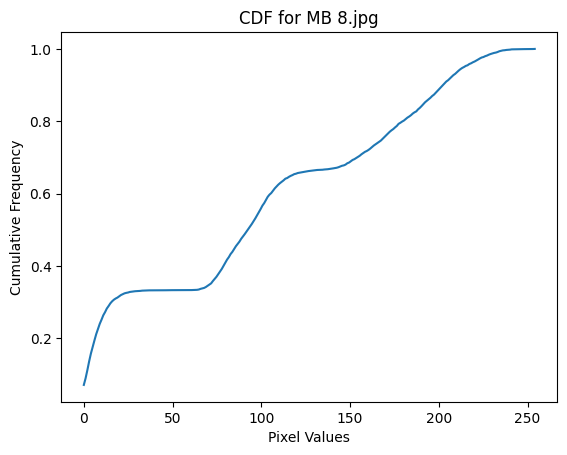

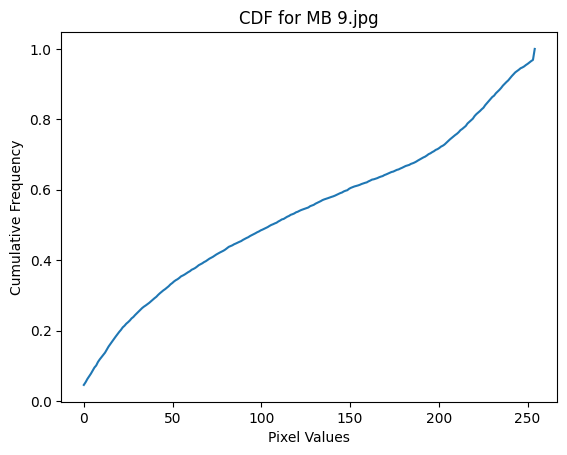

In [3]:
import os
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

path = "/content/drive/MyDrive/Colab Notebooks/MAWAR MERAH dan BIRU"
files = os.listdir(path)

def process_image(filename):
    img = cv2.imread(os.path.join(path, filename))
    red, green, blue = cv2.split(img)
    row = np.concatenate((red.flatten(), green.flatten(), blue.flatten()))
    arr = np.array(row)
    shape = arr.shape
    dim = arr.ndim
    df = pd.DataFrame(row).transpose()
    df.insert(0, "filename", filename)
    freq, bins = np.histogram(row, bins=256, range=(0, 255))
    cdf = np.cumsum(freq) / len(row)
    df_freq = pd.DataFrame(freq).transpose()
    df_freq.columns = [f"freq_{i}" for i in range(256)]
    df_cdf = pd.DataFrame(cdf).transpose()
    df_cdf.columns = [f"CDF_{i}" for i in range(256)]
    fig, ax = plt.subplots()
    ax.plot(bins[:-1], cdf)
    ax.set_title(f"CDF for {filename}")
    ax.set_xlabel("Pixel Values")
    ax.set_ylabel("Cumulative Frequency")
    plt.savefig(f"{filename}_CDF.png")
    return pd.concat([df, df_freq, df_cdf], axis=0), shape, dim

data = pd.DataFrame()
for file in files:
    if file.endswith(".jpg"):
        df, shape, dim = process_image(file)
        print(f"Filename: {file}")
        print(f"Shape: {shape}")
        print(f"Dimension: {dim}")
        data = pd.concat([data, df], axis=0)

data.to_excel("/content/drive/MyDrive/Colab Notebooks/folder program/output1Dmawar.xlsx", index=False)


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

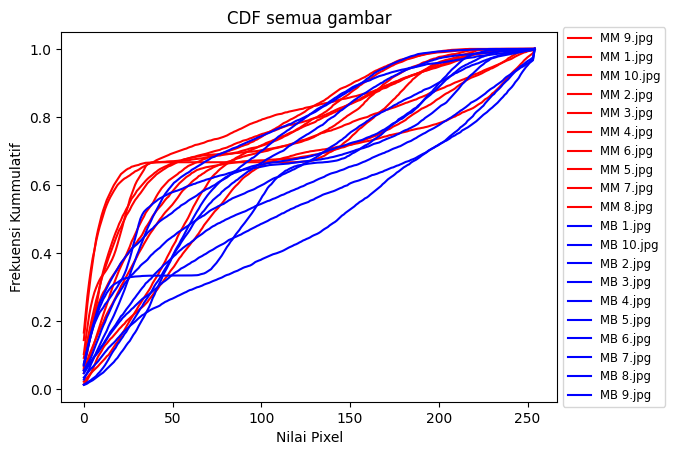

In [2]:
import os
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

path = "/content/drive/MyDrive/Colab Notebooks/MAWAR MERAH dan BIRU"
files = os.listdir(path)

colors = {"MM": "r", "Green": "g", "MB": "b"}

fig, ax = plt.subplots()

for file in files:
    if file.endswith(".jpg"):
        img = cv2.imread(os.path.join(path, file))
        filename, ext = os.path.splitext(file)
        color = filename.split()[0]
        red, green, blue = cv2.split(img)
        row = np.concatenate((red.flatten(), green.flatten(), blue.flatten()))
        freq, bins = np.histogram(row, bins=256, range=(0, 255))
        cdf = np.cumsum(freq) / len(row)
        ax.plot(bins[:-1], cdf, color=colors[color], label=file)

ax.set_title("CDF semua gambar")
ax.set_xlabel("Nilai Pixel")
ax.set_ylabel("Frekuensi Kummulatif")
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5), fontsize='small')

plt.savefig("/content/drive/MyDrive/Colab Notebooks/folder program/all_images_CDF.png")


📊 Memproses dan membuat Plot CDF dengan Titik (Dot Plot)...
✅ Grafik CDF Dot Plot berhasil disimpan di: /content/drive/MyDrive/Colab Notebooks/folder program/all_images_CDF_dots.png


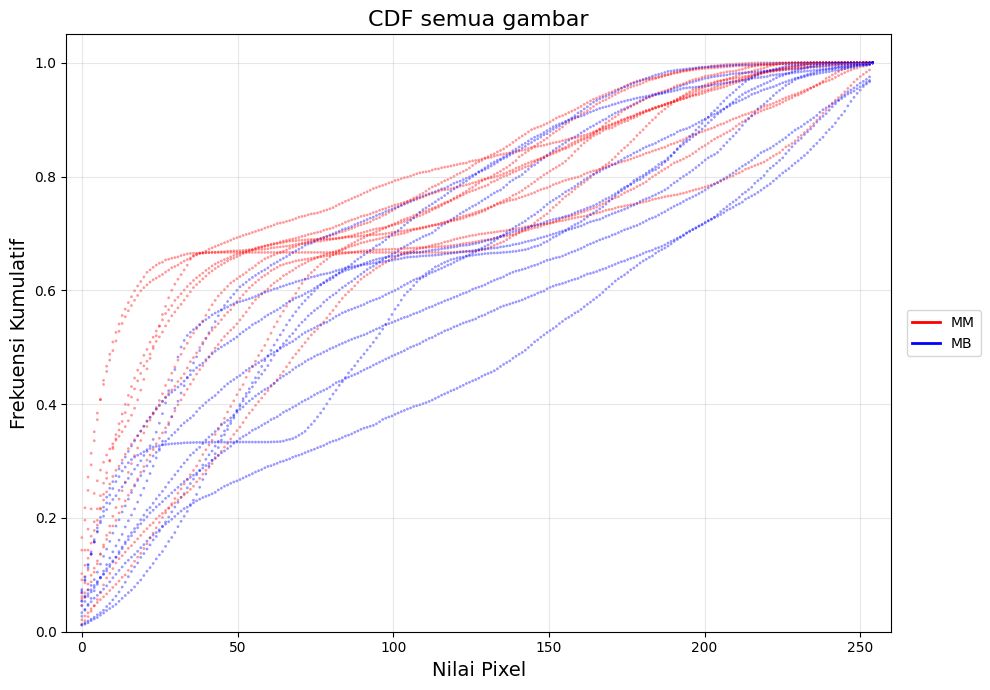

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt

# =============================================
# KONFIGURASI
# =============================================
# Ubah path ini sesuai folder gambar Anda
path = "/content/drive/MyDrive/Colab Notebooks/MAWAR MERAH dan BIRU"

# Tentukan lokasi penyimpanan hasil grafik
save_path = "/content/drive/MyDrive/Colab Notebooks/folder program/all_images_CDF_dots.png"

# Mapping label dari nama file ke warna
colors_map = {
    "MM": "#FF0000",    # Merah
    "Green": "#008000", # Hijau
    "MB": "#0000FF"     # Biru
}

# =============================================
# FUNGSI PLOT CDF DENGAN TITIK (DOT PLOT)
# =============================================
def plot_merged_cdf_dot_plot(folder_path):
    print("📊 Memproses dan membuat Plot CDF dengan Titik (Dot Plot)...")

    # Ambil semua file gambar .jpg
    files = [f for f in os.listdir(folder_path) if f.lower().endswith(".jpg")]
    if not files:
        print("❌ Tidak ada file .jpg ditemukan di folder.")
        return

    # Setup figure dengan 1 sumbu (seperti gambar Anda)
    fig, ax = plt.subplots(figsize=(10, 7))

    # Judul dan Label sumbu
    ax.set_title('CDF semua gambar', fontsize=16)
    ax.set_xlabel('Nilai Pixel', fontsize=14)
    ax.set_ylabel('Frekuensi Kumulatif', fontsize=14)
    ax.set_xlim(-5, 260)
    ax.set_ylim(0, 1.05)
    ax.grid(True, alpha=0.3)

    # Set untuk menyimpan label legenda agar tidak duplicate
    plotted_labels = set()

    # Loop setiap gambar
    for file in files:
        file_path = os.path.join(folder_path, file)
        img = cv2.imread(file_path)

        if img is None:
            continue

        # Ambil label dari nama file (bagian sebelum spasi)
        label = os.path.splitext(file)[0].split()[0]
        color = colors_map.get(label, "#000000") # Default hitam jika label tak dikenali

        # Pisahkan BGR, lalu gabung semua pixel R, G, B menjadi 1 array 1D
        b, g, r = cv2.split(img)
        combined_pixels = np.concatenate((r.flatten(), g.flatten(), b.flatten()))

        # Hitung Histogram dan CDF
        freq, bins = np.histogram(combined_pixels, bins=256, range=(0, 255))
        cdf = np.cumsum(freq) / len(combined_pixels)

        # --- MEMBUAT GRAFIK TITIK (DOT PLOT) ---
        # Garis vertikal pada step function dihilangkan.
        # Data diplot hanya berupa titik-titik diskrit pada setiap nilai intensitas.
        # Parameter `s=3` mengatur ukuran titik (semakin kecil semakin rapat).
        # Parameter `alpha=0.4` memberikan transparansi agar titik yang saling menumpuk terlihat.

        ax.scatter(bins[:-1], cdf,
                   c=color,
                   s=4,             # ukuran titik (dot)
                   alpha=0.4,       # transparansi
                   marker='o',      # bentuk lingkaran kecil
                   edgecolors='none')

        # Tambahkan ke legenda
        if label not in plotted_labels:
            # Plot dummy untuk legenda agar muncul dengan warna yang benar
            ax.plot([], [], color=color, label=label, linewidth=2)
            plotted_labels.add(label)

    # Atur posisi legenda di luar kanan (seperti gambar Anda)
    ax.legend(loc='center left', bbox_to_anchor=(1.01, 0.5), fontsize='medium', frameon=True)

    plt.tight_layout()

    # Simpan grafik ke file
    save_dir = os.path.dirname(save_path)
    if not os.path.exists(save_dir):
        os.makedirs(save_dir)
    plt.savefig(save_path, dpi=300, bbox_inches='tight')
    print(f"✅ Grafik CDF Dot Plot berhasil disimpan di: {save_path}")

    # Tampilkan di layar
    plt.show()

# =============================================
# EKSEKUSI
# =============================================
if os.path.exists(path):
    plot_merged_cdf_dot_plot(path)
else:
    print(f"❌ Folder '{path}' tidak ditemukan. Harap periksa kembali path Anda.")

Filename: MM 10.jpg
Shape: (7500,)
Dimension: 1
Filename: MM 2.jpg
Shape: (7500,)
Dimension: 1
Filename: MM 3.jpg
Shape: (7500,)
Dimension: 1
Filename: MM 4.jpg
Shape: (7500,)
Dimension: 1
Filename: MM 5.jpg
Shape: (7500,)
Dimension: 1
Filename: MM 6.jpg
Shape: (7500,)
Dimension: 1
Filename: MM 7.jpg
Shape: (7500,)
Dimension: 1
Filename: MM 8.jpg
Shape: (7500,)
Dimension: 1
Filename: MM 9.jpg
Shape: (7500,)
Dimension: 1
Filename: MB 10.jpg
Shape: (7500,)
Dimension: 1
Filename: MB 2.jpg
Shape: (7500,)
Dimension: 1
Filename: MB 3.jpg
Shape: (7500,)
Dimension: 1
Filename: MB 4.jpg
Shape: (7500,)
Dimension: 1
Filename: MB 5.jpg
Shape: (7500,)
Dimension: 1
Filename: MB 6.jpg
Shape: (7500,)
Dimension: 1
Filename: MB 7.jpg
Shape: (7500,)
Dimension: 1
Filename: MB 8.jpg
Shape: (7500,)
Dimension: 1
Filename: MB 9.jpg
Shape: (7500,)
Dimension: 1
Filename: MM 1.jpg
Shape: (7500,)
Dimension: 1
Filename: MB 1.jpg
Shape: (7500,)
Dimension: 1
KL divergence between Red 1 and other images:
{'MM 10.jpg'

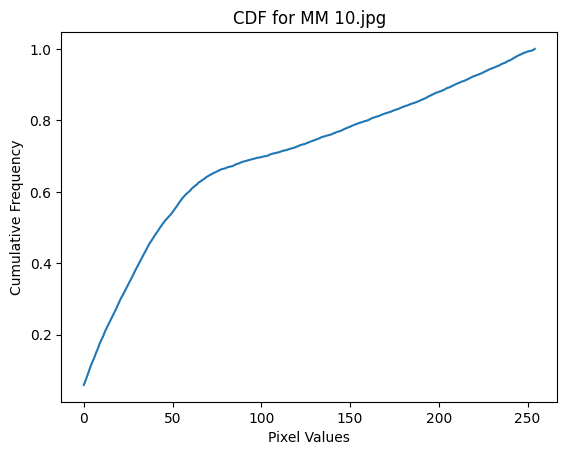

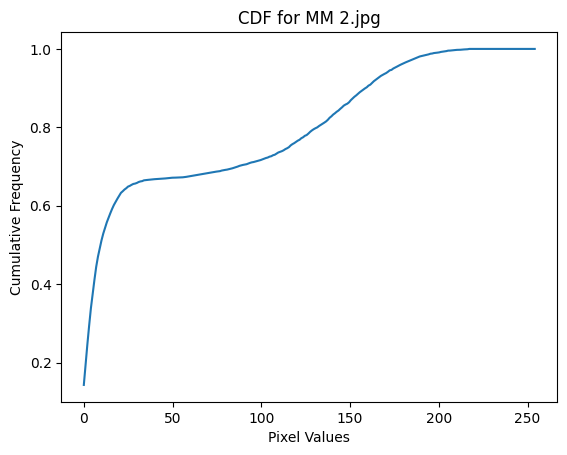

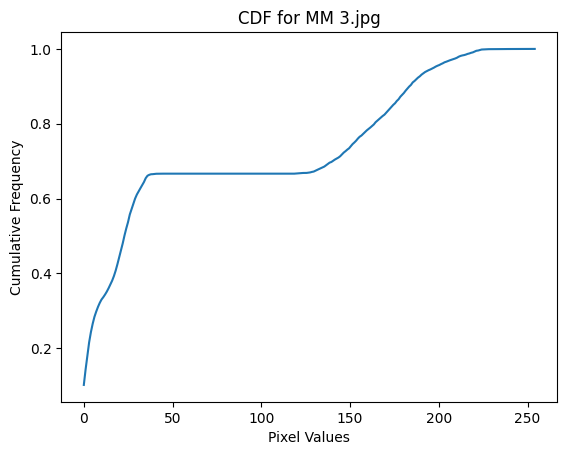

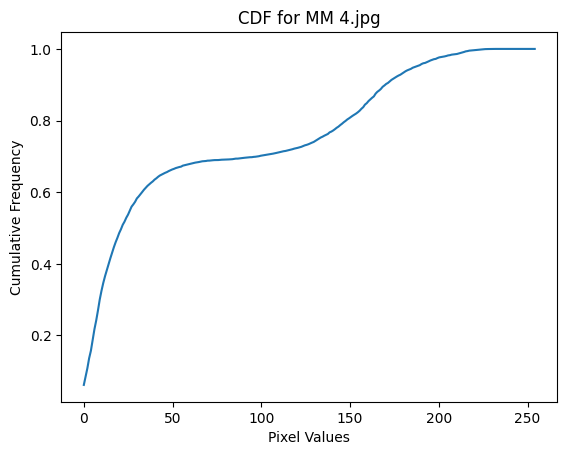

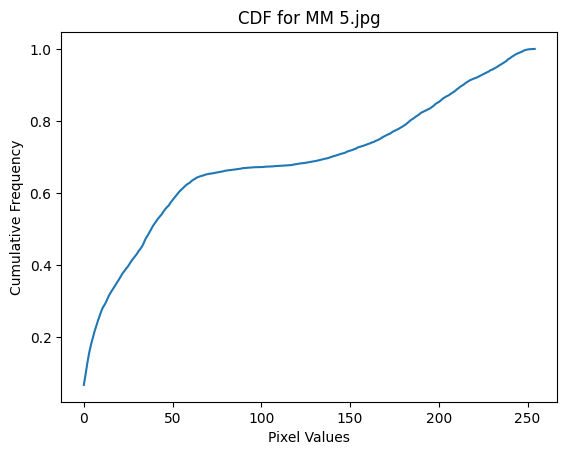

...

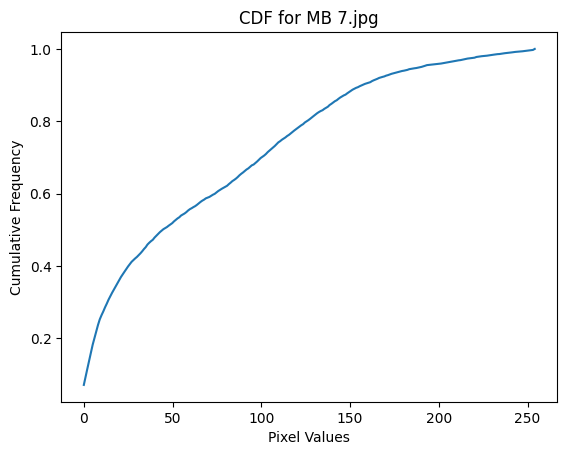

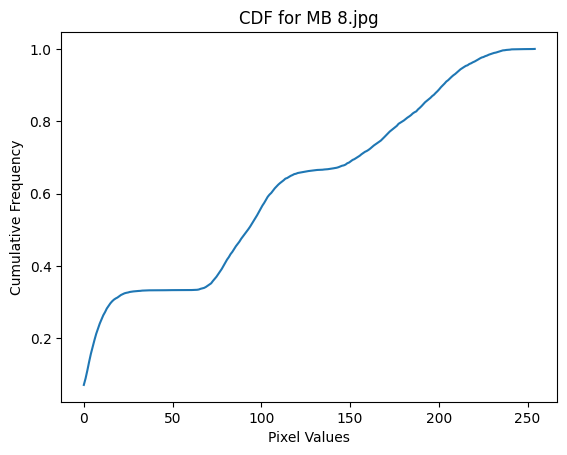

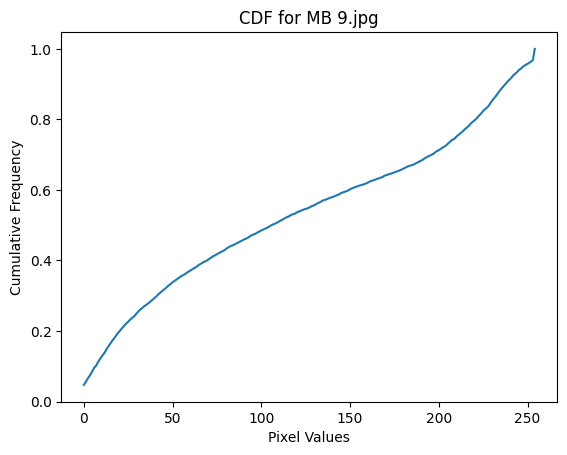

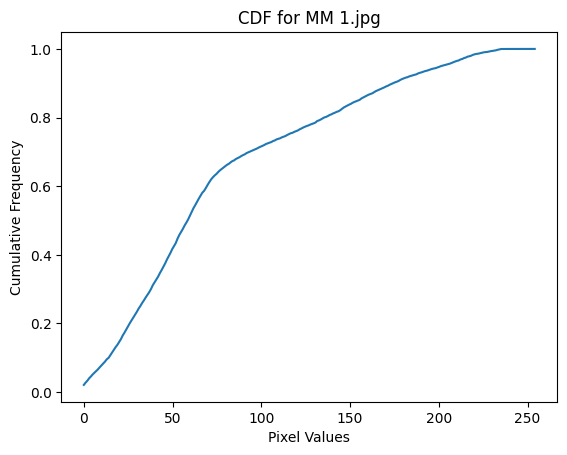

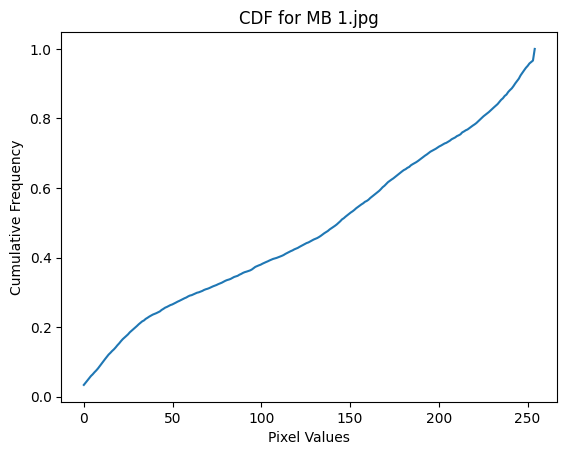

In [ ]:
import os
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import entropy

path = "/content/drive/MyDrive/Colab Notebooks/MAWAR MERAH dan BIRU"
files = os.listdir(path)

def process_image(filename):
    img = cv2.imread(os.path.join(path, filename))
    red, green, blue = cv2.split(img)
    row = np.concatenate((red.flatten(), green.flatten(), blue.flatten()))
    arr = np.array(row)
    shape = arr.shape
    dim = arr.ndim
    df = pd.DataFrame(row).transpose()
    df.insert(0, "filename", filename)
    freq, bins = np.histogram(row, bins=256, range=(0, 255))
    cdf = np.cumsum(freq) / len(row)
    df_freq = pd.DataFrame(freq).transpose()
    df_freq.columns = [f"freq_{i}" for i in range(256)]
    df_freq.insert(0, "filename", filename)  # add filename column
    df_cdf = pd.DataFrame(cdf).transpose()
    df_cdf.columns = [f"CDF_{i}" for i in range(256)]
    fig, ax = plt.subplots()
    ax.plot(bins[:-1], cdf)
    ax.set_title(f"CDF for {filename}")
    ax.set_xlabel("Pixel Values")
    ax.set_ylabel("Cumulative Frequency")
    plt.savefig("/content/drive/MyDrive/Colab Notebooks/folder program/"f"{filename}_CDF.png")
    return pd.concat([df, df_freq, df_cdf], axis=0), shape, dim, freq


data = pd.DataFrame()
freq_dict = {}
for file in files:
    if file.endswith(".jpg"):
        df, shape, dim, freq = process_image(file)
        print(f"Filename: {file}")
        print(f"Shape: {shape}")
        print(f"Dimension: {dim}")
        data = pd.concat([data, df], axis=0)
        freq_dict[file] = freq

# Calculate KL divergence between Red 1 and all other images
red1_freq = freq_dict["MM 1.jpg"]
red1_kl_divergence = {}
for file, freq in freq_dict.items():
    if file.endswith(".jpg"):
        kl_div = entropy(red1_freq, freq)
        red1_kl_divergence[file] = kl_div

print("KL divergence between Red 1 and other images:")
print(red1_kl_divergence)

# Calculate KL divergence between Blue 1 and all other images
blue1_freq = freq_dict["MB 1.jpg"]
blue1_kl_divergence = {}
for file, freq in freq_dict.items():
    if file.endswith(".jpg"):
        kl_div = entropy(blue1_freq, freq)
        blue1_kl_divergence[file] = kl_div

print("KL divergence between Blue 1 and other images:")
print(blue1_kl_divergence)

data.to_excel("/content/drive/MyDrive/Colab Notebooks/folder program/output1Dmawar.xlsx", index=False)


In [ ]:
# Create DataFrame for Red 1 KL divergence
red1_kl_div_df = pd.DataFrame.from_dict(red1_kl_divergence, orient="index", columns=["Red 1 KL Divergence"])
red1_kl_div_df.index.name = "filename"

# Create DataFrame for Blue 1 KL divergence
blue1_kl_div_df = pd.DataFrame.from_dict(blue1_kl_divergence, orient="index", columns=["Blue 1 KL Divergence"])
blue1_kl_div_df.index.name = "filename"

# Merge the two DataFrames
kl_div_df = red1_kl_div_df.join(blue1_kl_div_df)

# Save to Excel
kl_div_df.to_excel("/content/drive/MyDrive/Colab Notebooks/folder program/kl_divergence.xlsx")


Filename: MM 10.jpg
Shape: (7500,)
Dimension: 1
Filename: MM 2.jpg
Shape: (7500,)
Dimension: 1
Filename: MM 3.jpg
Shape: (7500,)
Dimension: 1
Filename: MM 4.jpg
Shape: (7500,)
Dimension: 1
Filename: MM 5.jpg
Shape: (7500,)
Dimension: 1
Filename: MM 6.jpg
Shape: (7500,)
Dimension: 1
Filename: MM 7.jpg
Shape: (7500,)
Dimension: 1
Filename: MM 8.jpg
Shape: (7500,)
Dimension: 1
Filename: MM 9.jpg
Shape: (7500,)
Dimension: 1
Filename: MB 10.jpg
Shape: (7500,)
Dimension: 1
Filename: MB 2.jpg
Shape: (7500,)
Dimension: 1
Filename: MB 3.jpg
Shape: (7500,)
Dimension: 1
Filename: MB 4.jpg
Shape: (7500,)
Dimension: 1
Filename: MB 5.jpg
Shape: (7500,)
Dimension: 1
Filename: MB 6.jpg
Shape: (7500,)
Dimension: 1
Filename: MB 7.jpg
Shape: (7500,)
Dimension: 1
Filename: MB 8.jpg
Shape: (7500,)
Dimension: 1
Filename: MB 9.jpg
Shape: (7500,)
Dimension: 1
Filename: MM 1.jpg
Shape: (7500,)
Dimension: 1
Filename: MB 1.jpg
Shape: (7500,)
Dimension: 1
JS divergence between Red 1 and other images:
{'MM 10.jpg'

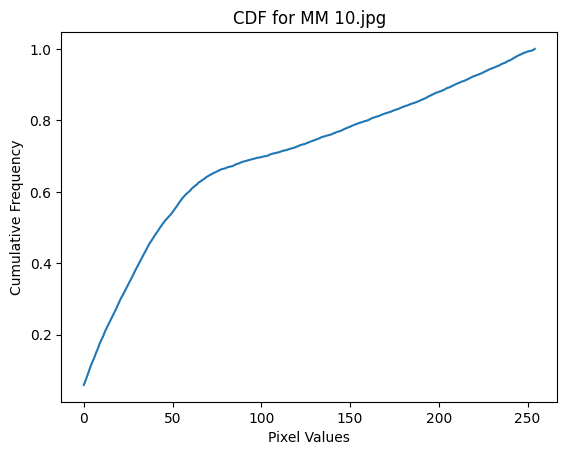

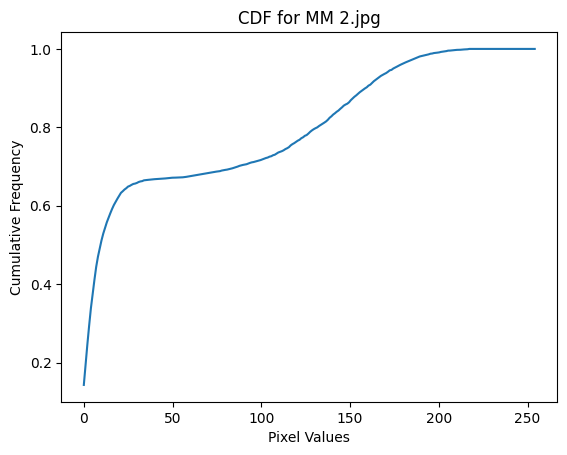

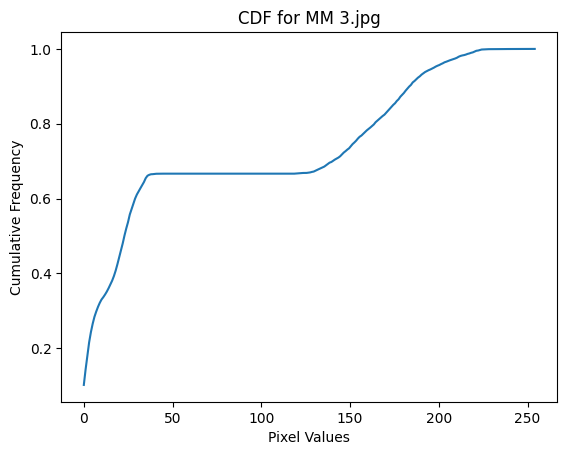

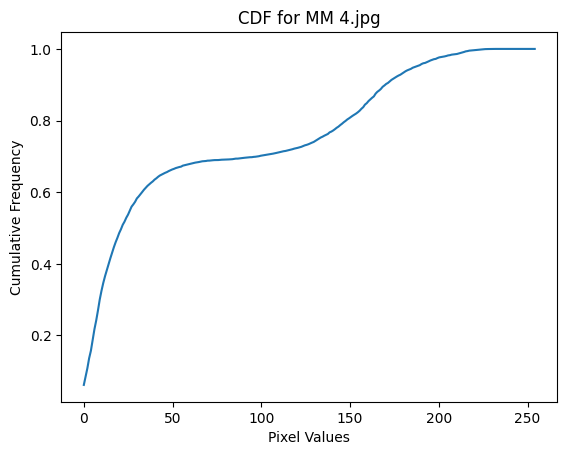

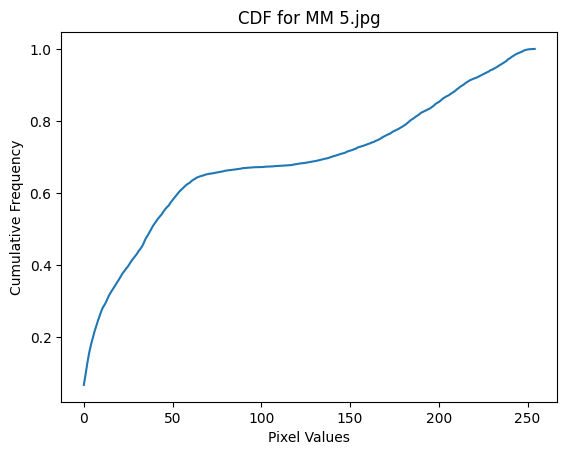

...

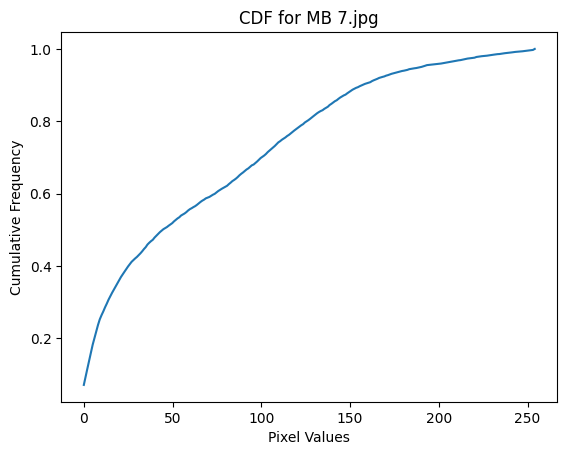

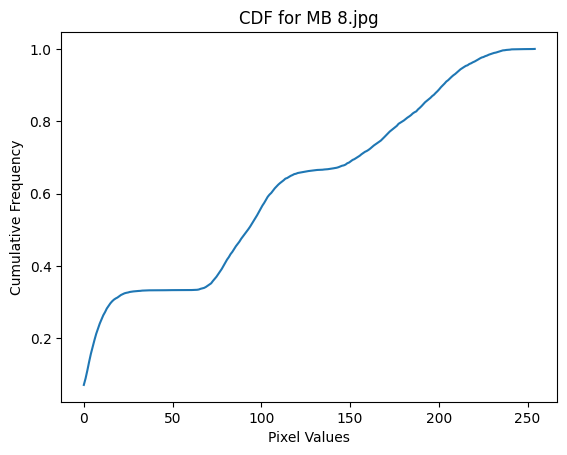

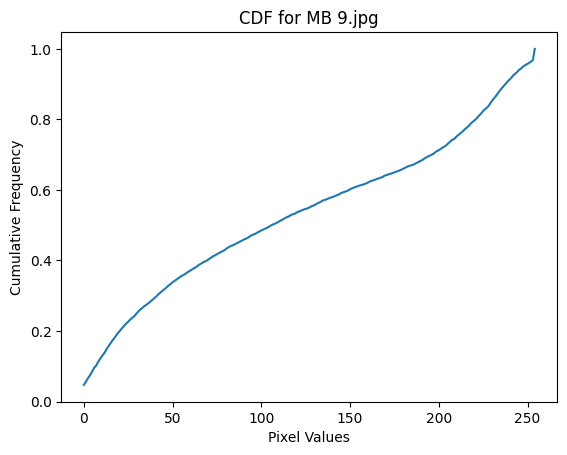

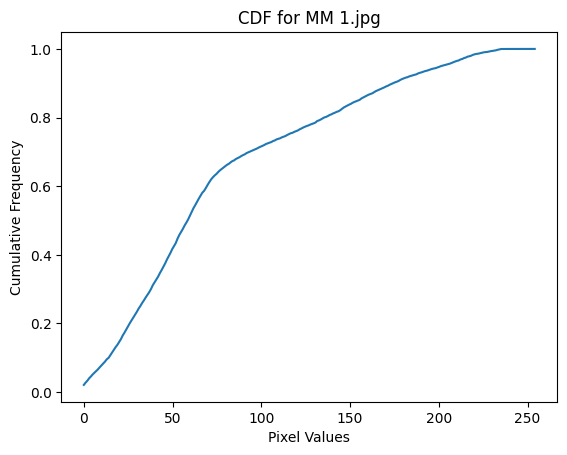

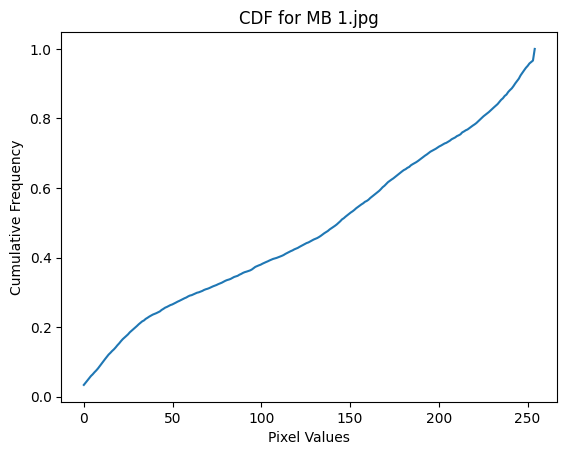

In [ ]:
import os
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import entropy

path = "/content/drive/MyDrive/Colab Notebooks/MAWAR MERAH dan BIRU"
files = os.listdir(path)

def process_image(filename):
    img = cv2.imread(os.path.join(path, filename))
    red, green, blue = cv2.split(img)
    row = np.concatenate((red.flatten(), green.flatten(), blue.flatten()))
    arr = np.array(row)
    shape = arr.shape
    dim = arr.ndim
    df = pd.DataFrame(row).transpose()
    df.insert(0, "filename", filename)
    freq, bins = np.histogram(row, bins=256, range=(0, 255))
    cdf = np.cumsum(freq) / len(row)
    df_freq = pd.DataFrame(freq).transpose()
    df_freq.columns = [f"freq_{i}" for i in range(256)]
    df_freq.insert(0, "filename", filename)  # add filename column
    df_cdf = pd.DataFrame(cdf).transpose()
    df_cdf.columns = [f"CDF_{i}" for i in range(256)]
    fig, ax = plt.subplots()
    ax.plot(bins[:-1], cdf)
    ax.set_title(f"CDF for {filename}")
    ax.set_xlabel("Pixel Values")
    ax.set_ylabel("Cumulative Frequency")
    plt.savefig("/content/drive/MyDrive/Colab Notebooks/folder program/"f"{filename}_CDF.png")
    return pd.concat([df, df_freq, df_cdf], axis=0), shape, dim, freq


data = pd.DataFrame()
freq_dict = {}
for file in files:
    if file.endswith(".jpg"):
        df, shape, dim, freq = process_image(file)
        print(f"Filename: {file}")
        print(f"Shape: {shape}")
        print(f"Dimension: {dim}")
        data = pd.concat([data, df], axis=0)
        freq_dict[file] = freq

# Calculate JS divergence between Red 1 and all other images
red1_freq = freq_dict["MM 1.jpg"]
red1_js_divergence = {}
for file, freq in freq_dict.items():
    if file.endswith(".jpg"):
        avg_freq = (red1_freq + freq) / 2
        js_div = (entropy(red1_freq, avg_freq) + entropy(freq, avg_freq)) / 2
        red1_js_divergence[file] = js_div

print("JS divergence between Red 1 and other images:")
print(red1_js_divergence)

# Calculate JS divergence between Blue 1 and all other images
blue1_freq = freq_dict["MB 1.jpg"]
blue1_js_divergence = {}
for file, freq in freq_dict.items():
    if file.endswith(".jpg"):
        avg_freq = (blue1_freq + freq) / 2
        js_div = (entropy(blue1_freq, avg_freq) + entropy(freq, avg_freq)) / 2
        blue1_js_divergence[file] = js_div

print("JS divergence between Blue 1 and other images:")
print(blue1_js_divergence)

data.to_excel("/content/drive/MyDrive/Colab Notebooks/folder program/output1Dmawar.xlsx", index=False)


In [ ]:
# Create DataFrame for Red 1 JS divergence
red1_js_div_df = pd.DataFrame.from_dict(red1_js_divergence, orient="index", columns=["Red 1 JS Divergence"])
red1_js_div_df.index.name = "filename"

# Create DataFrame for Blue 1 JS divergence
blue1_js_div_df = pd.DataFrame.from_dict(blue1_js_divergence, orient="index", columns=["Blue 1 JS Divergence"])
blue1_js_div_df.index.name = "filename"

# Merge the two DataFrames
js_div_df = red1_js_div_df.join(blue1_js_div_df)

# Save to Excel
js_div_df.to_excel("/content/drive/MyDrive/Colab Notebooks/folder program/JS_divergence.xlsx")


Filename: MM 10.jpg
Shape: (7500,)
Dimension: 1
Filename: MM 2.jpg
Shape: (7500,)
Dimension: 1
Filename: MM 3.jpg
Shape: (7500,)
Dimension: 1
Filename: MM 4.jpg
Shape: (7500,)
Dimension: 1
Filename: MM 5.jpg
Shape: (7500,)
Dimension: 1
Filename: MM 6.jpg
Shape: (7500,)
Dimension: 1
Filename: MM 7.jpg
Shape: (7500,)
Dimension: 1
Filename: MM 8.jpg
Shape: (7500,)
Dimension: 1
Filename: MM 9.jpg
Shape: (7500,)
Dimension: 1
Filename: MB 10.jpg
Shape: (7500,)
Dimension: 1
Filename: MB 2.jpg
Shape: (7500,)
Dimension: 1
Filename: MB 3.jpg
Shape: (7500,)
Dimension: 1
Filename: MB 4.jpg
Shape: (7500,)
Dimension: 1
Filename: MB 5.jpg
Shape: (7500,)
Dimension: 1
Filename: MB 6.jpg
Shape: (7500,)
Dimension: 1
Filename: MB 7.jpg
Shape: (7500,)
Dimension: 1
Filename: MB 8.jpg
Shape: (7500,)
Dimension: 1
Filename: MB 9.jpg
Shape: (7500,)
Dimension: 1
Filename: MM 1.jpg
Shape: (7500,)
Dimension: 1
Filename: MB 1.jpg
Shape: (7500,)
Dimension: 1
KL divergence between Red 1 and other images:
{'MM 10.jpg'

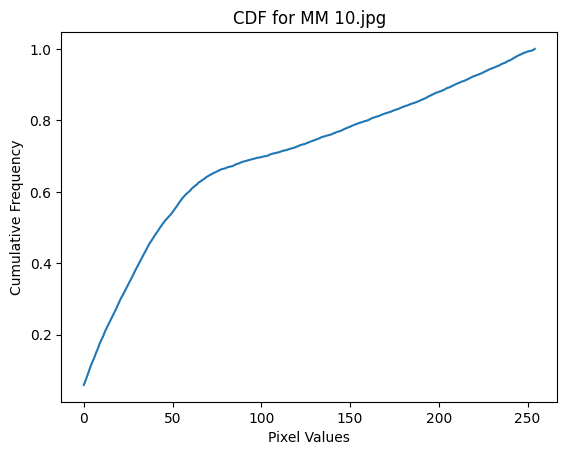

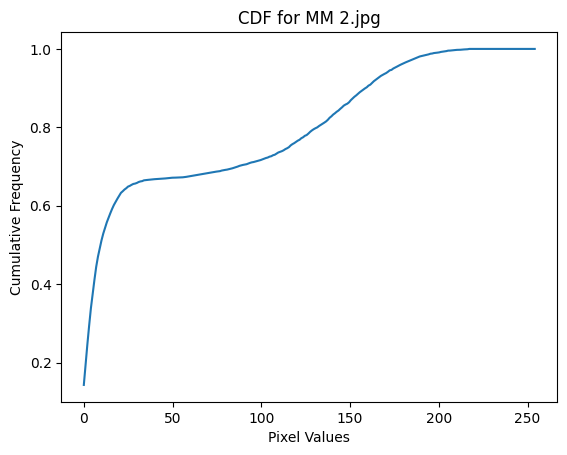

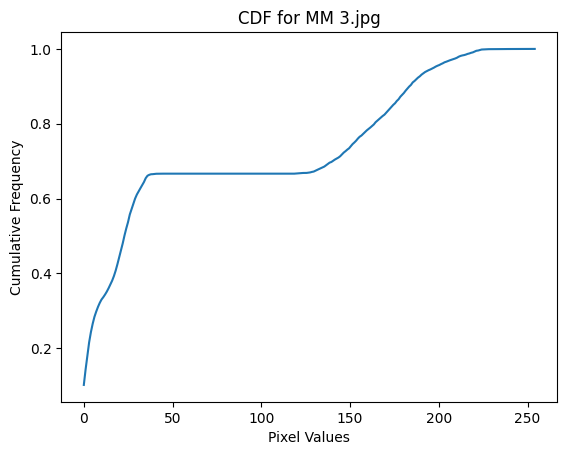

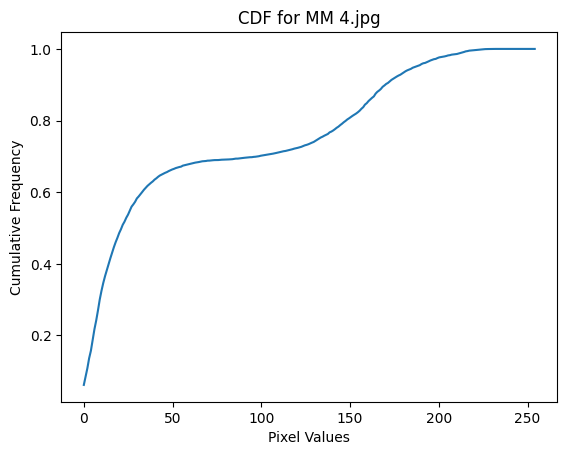

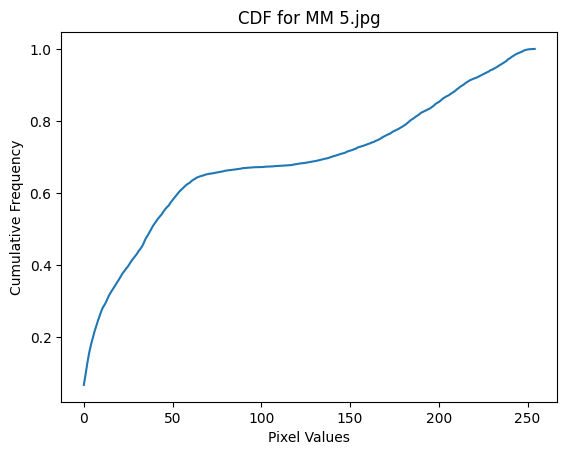

...

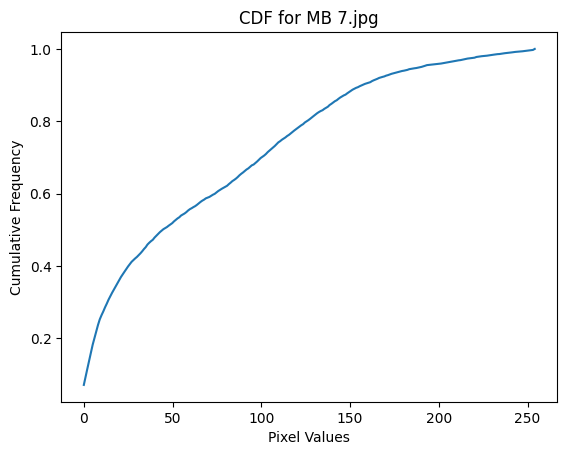

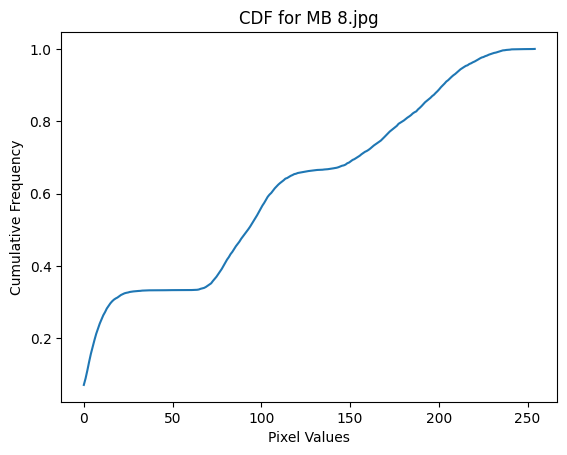

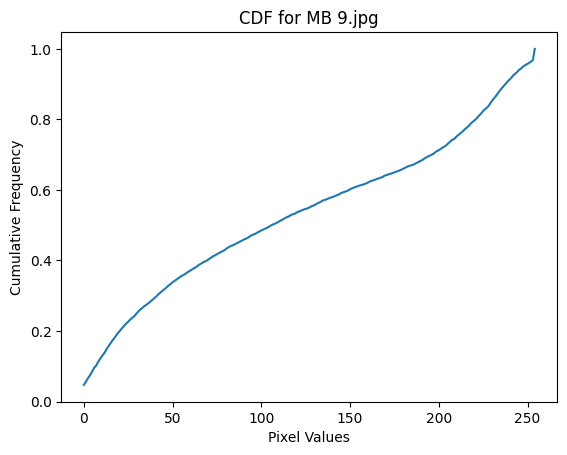

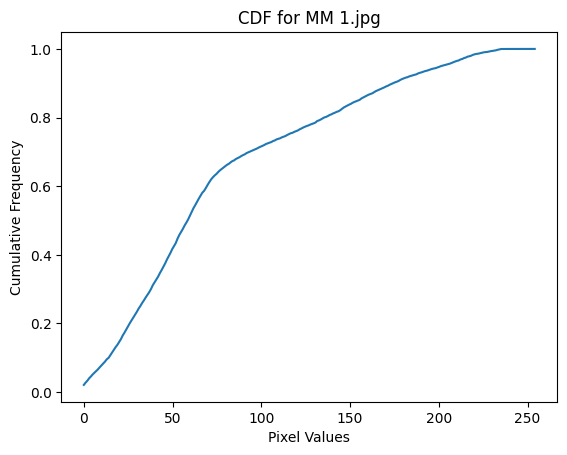

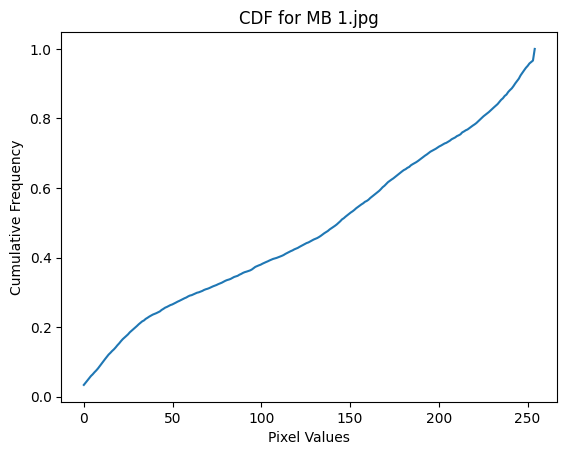

In [ ]:
import os
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import entropy

path = "/content/drive/MyDrive/Colab Notebooks/MAWAR MERAH dan BIRU"
files = os.listdir(path)

def process_image(filename):
    img = cv2.imread(os.path.join(path, filename))
    red, green, blue = cv2.split(img)
    row = np.concatenate((red.flatten(), green.flatten(), blue.flatten()))
    arr = np.array(row)
    shape = arr.shape
    dim = arr.ndim
    df = pd.DataFrame(row).transpose()
    df.insert(0, "filename", filename)
    freq, bins = np.histogram(row, bins=256, range=(0, 255))
    cdf = np.cumsum(freq) / len(row)
    df_freq = pd.DataFrame(freq).transpose()
    df_freq.columns = [f"freq_{i}" for i in range(256)]
    df_cdf = pd.DataFrame(cdf).transpose()
    df_cdf.columns = [f"CDF_{i}" for i in range(256)]
    fig, ax = plt.subplots()
    ax.plot(bins[:-1], cdf)
    ax.set_title(f"CDF for {filename}")
    ax.set_xlabel("Pixel Values")
    ax.set_ylabel("Cumulative Frequency")
    plt.savefig("/content/drive/MyDrive/Colab Notebooks/folder program/"f"{filename}_CDF.png")
    return pd.concat([df, df_freq, df_cdf], axis=0), shape, dim, cdf

data = pd.DataFrame()
cdf_dict = {}
for file in files:
    if file.endswith(".jpg"):
        df, shape, dim, cdf = process_image(file)
        print(f"Filename: {file}")
        print(f"Shape: {shape}")
        print(f"Dimension: {dim}")
        data = pd.concat([data, df], axis=0)
        cdf_dict[file] = cdf

# Calculate KL divergence between Red 1 and all other images
red1_cdf = cdf_dict["MM 1.jpg"]
red1_kl_divergence = {}
for file, cdf in cdf_dict.items():
    if file.endswith(".jpg"):
        kl_div = entropy(red1_cdf, cdf)
        red1_kl_divergence[file] = kl_div

print("KL divergence between Red 1 and other images:")
print(red1_kl_divergence)

# Calculate KL divergence between Blue 1 and all other images
blue1_cdf = cdf_dict["MB 1.jpg"]
blue1_kl_divergence = {}
for file, cdf in cdf_dict.items():
    if file.endswith(".jpg"):
        kl_div = entropy(blue1_cdf, cdf)
        blue1_kl_divergence[file] = kl_div

print("KL divergence between Blue 1 and other images:")
print(blue1_kl_divergence)

data.to_excel("/content/drive/MyDrive/Colab Notebooks/folder program/output1Dmawar.xlsx", index=False)


In [ ]:
# Create DataFrame for Red 1 KL divergence
red1_kl_div_df = pd.DataFrame.from_dict(red1_kl_divergence, orient="index", columns=["Red 1 KL Divergence"])
red1_kl_div_df.index.name = "filename"

# Create DataFrame for Blue 1 KL divergence
blue1_kl_div_df = pd.DataFrame.from_dict(blue1_kl_divergence, orient="index", columns=["Blue 1 KL Divergence"])
blue1_kl_div_df.index.name = "filename"

# Merge the two DataFrames
kl_div_df = red1_kl_div_df.join(blue1_kl_div_df)

# Save to Excel
kl_div_df.to_excel("/content/drive/MyDrive/Colab Notebooks/folder program/kl_divergence.xlsx")

Filename: MM 10.jpg
Shape: (7500,)
Dimension: 1
Filename: MM 2.jpg
Shape: (7500,)
Dimension: 1
Filename: MM 3.jpg
Shape: (7500,)
Dimension: 1
Filename: MM 4.jpg
Shape: (7500,)
Dimension: 1
Filename: MM 5.jpg
Shape: (7500,)
Dimension: 1
Filename: MM 6.jpg
Shape: (7500,)
Dimension: 1
Filename: MM 7.jpg
Shape: (7500,)
Dimension: 1
Filename: MM 8.jpg
Shape: (7500,)
Dimension: 1
Filename: MM 9.jpg
Shape: (7500,)
Dimension: 1
Filename: MB 10.jpg
Shape: (7500,)
Dimension: 1
Filename: MB 2.jpg
Shape: (7500,)
Dimension: 1
Filename: MB 3.jpg
Shape: (7500,)
Dimension: 1
Filename: MB 4.jpg
Shape: (7500,)
Dimension: 1
Filename: MB 5.jpg
Shape: (7500,)
Dimension: 1
Filename: MB 6.jpg
Shape: (7500,)
Dimension: 1
Filename: MB 7.jpg
Shape: (7500,)
Dimension: 1
Filename: MB 8.jpg
Shape: (7500,)
Dimension: 1
Filename: MB 9.jpg
Shape: (7500,)
Dimension: 1
Filename: MM 1.jpg
Shape: (7500,)
Dimension: 1
Filename: MB 1.jpg
Shape: (7500,)
Dimension: 1
KL divergence between Red 1 and other images:
{'MM 10.jpg'

/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Cluster 1:


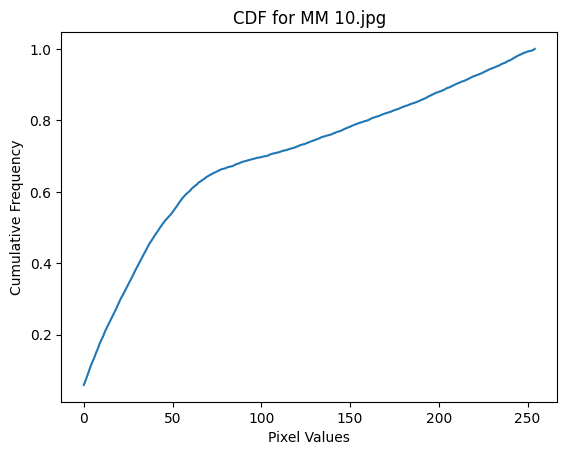

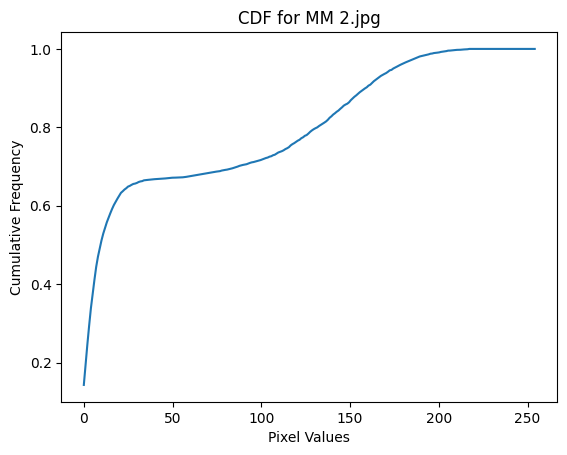

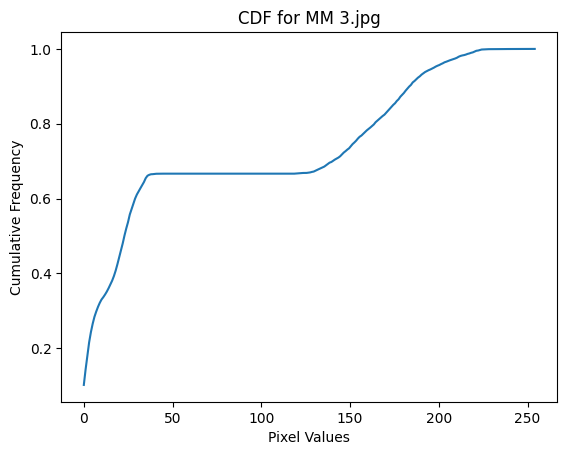

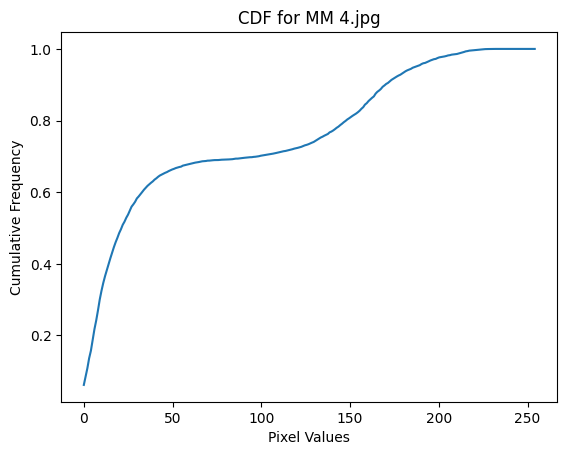

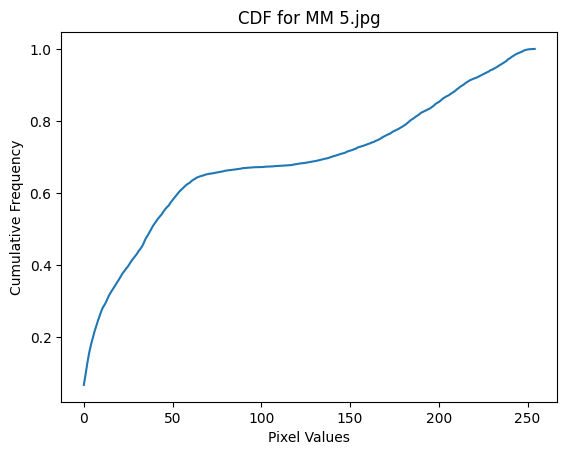

...

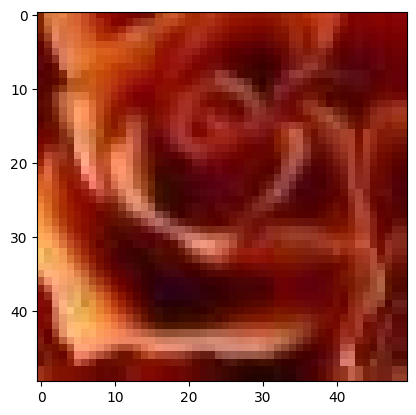

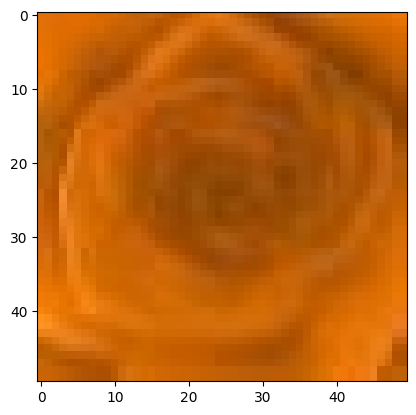

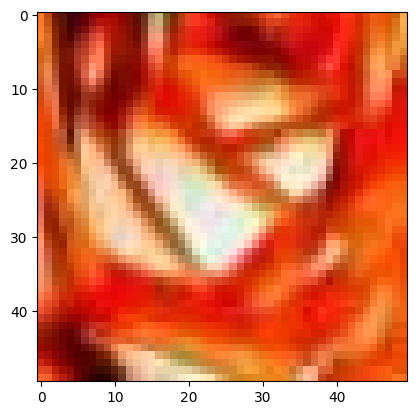

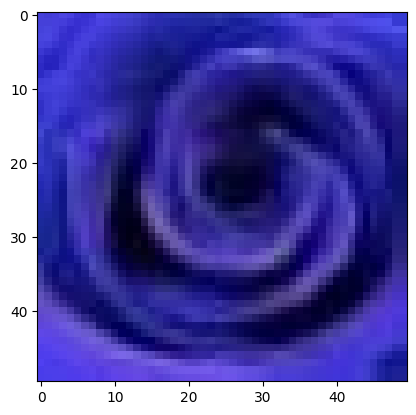

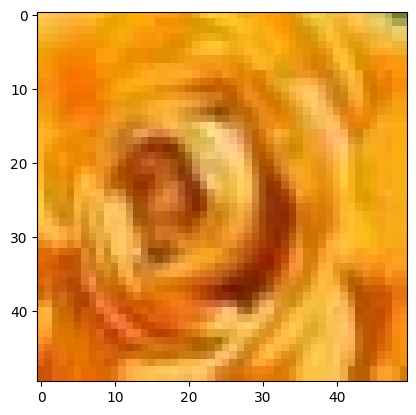

Cluster 2:


In [ ]:
import os
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import entropy

path = "/content/drive/MyDrive/Colab Notebooks/MAWAR MERAH dan BIRU"
files = os.listdir(path)

def process_image(filename):
    img = cv2.imread(os.path.join(path, filename))
    red, green, blue = cv2.split(img)
    row = np.concatenate((red.flatten(), green.flatten(), blue.flatten()))
    arr = np.array(row)
    shape = arr.shape
    dim = arr.ndim
    df = pd.DataFrame(row).transpose()
    df.insert(0, "filename", filename)
    freq, bins = np.histogram(row, bins=256, range=(0, 255))
    cdf = np.cumsum(freq) / len(row)
    df_freq = pd.DataFrame(freq).transpose()
    df_freq.columns = [f"freq_{i}" for i in range(256)]
    df_cdf = pd.DataFrame(cdf).transpose()
    df_cdf.columns = [f"CDF_{i}" for i in range(256)]
    fig, ax = plt.subplots()
    ax.plot(bins[:-1], cdf)
    ax.set_title(f"CDF for {filename}")
    ax.set_xlabel("Pixel Values")
    ax.set_ylabel("Cumulative Frequency")
    plt.savefig("/content/drive/MyDrive/Colab Notebooks/folder program/"f"{filename}_CDF.png")
    return pd.concat([df, df_freq, df_cdf], axis=0), shape, dim, cdf

data = pd.DataFrame()
cdf_dict = {}
for file in files:
    if file.endswith(".jpg"):
        df, shape, dim, cdf = process_image(file)
        print(f"Filename: {file}")
        print(f"Shape: {shape}")
        print(f"Dimension: {dim}")
        data = pd.concat([data, df], axis=0)
        cdf_dict[file] = cdf

# Calculate KL divergence between Red 1 and all other images
red1_cdf = cdf_dict["MM 1.jpg"]
red1_kl_divergence = {}
for file, cdf in cdf_dict.items():
    if file.endswith(".jpg"):
        kl_div = entropy(red1_cdf, cdf)
        red1_kl_divergence[file] = kl_div

print("KL divergence between Red 1 and other images:")
print(red1_kl_divergence)

# Calculate KL divergence between Blue 1 and all other images
blue1_cdf = cdf_dict["MB 1.jpg"]
blue1_kl_divergence = {}
for file, cdf in cdf_dict.items():
    if file.endswith(".jpg"):
        kl_div = entropy(blue1_cdf, cdf)
        blue1_kl_divergence[file] = kl_div

print("KL divergence between Blue 1 and other images:")
print(blue1_kl_divergence)

# Create initial centroids using CDF of Red 1 and Blue 1 images
centroids = [red1_cdf, blue1_cdf]

# Implement K-means clustering
def k_means_clustering(cdf_dict, centroids, num_iterations):
    num_clusters = len(centroids)
    cluster_labels = {file: None for file in cdf_dict.keys() if file.endswith(".jpg")}
    for i in range(num_iterations):
        clusters = [[] for _ in range(num_clusters)]
        for file, cdf in cdf_dict.items():
            if file.endswith(".jpg"):
                kl_divergences = [entropy(cdf, centroid) for centroid in centroids]
                closest_centroid_idx = np.argmin(kl_divergences)
                clusters[closest_centroid_idx].append(file)
                cluster_labels[file] = closest_centroid_idx
        centroids = [np.mean([cdf_dict[file] for file in cluster]) for cluster in clusters]
    return cluster_labels


import openpyxl
from openpyxl.utils import get_column_letter

# Define number of iterations and number of clusters
num_iterations = 5
num_clusters = 2

# Run K-means clustering
cluster_labels = k_means_clustering(cdf_dict, centroids, num_iterations)

# Save cluster labels to Excel file
wb = openpyxl.Workbook()
ws = wb.active
ws.title = "Cluster Labels"

# Write header row
ws.cell(row=1, column=1, value="Filename")
for i in range(num_iterations):
    ws.cell(row=1, column=i+2, value=f"Iteration {i+1}")

# Write data rows
for idx, file in enumerate(cluster_labels):
    row = idx + 2
    ws.cell(row=row, column=1, value=file)
    ws.cell(row=row, column=2, value=cluster_labels[file])

# Auto-fit columns
for col in ws.columns:
    column = col[0].column
    letter = get_column_letter(column)
    ws.column_dimensions[letter].auto_size = True

# Save workbook
wb.save("/content/drive/MyDrive/Colab Notebooks/folder program/cluster_labels.xlsx")

# View images per cluster
for i in range(num_clusters):
    print(f"Cluster {i+1}:")
    for file, cluster_label in cluster_labels.items():
        if cluster_label == i:
            img = cv2.imread(os.path.join(path, file))
            plt.imshow(img)
            plt.show()


Cluster 1:


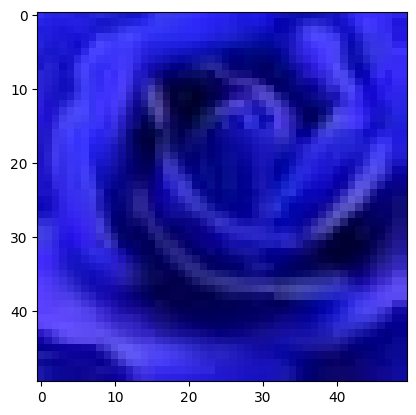

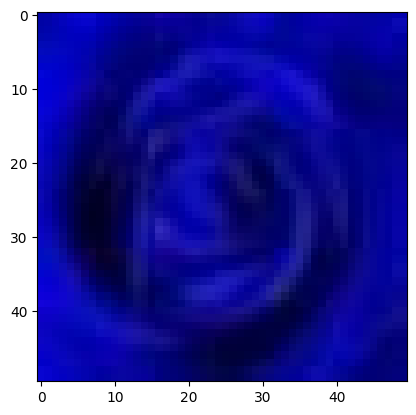

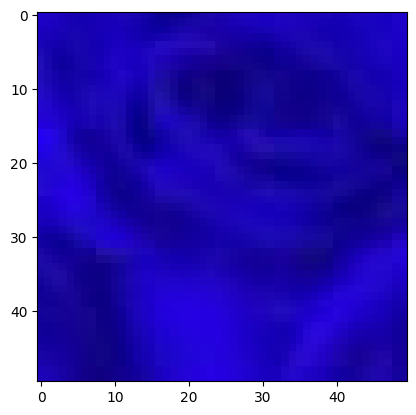

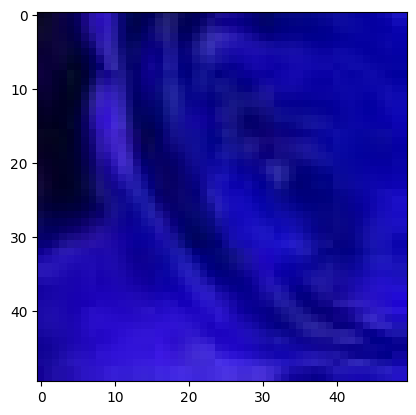

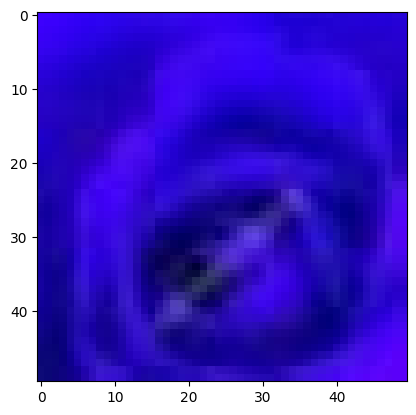

...

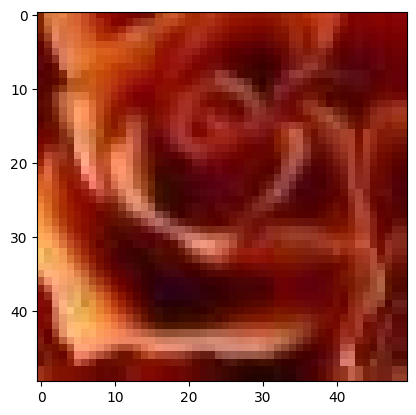

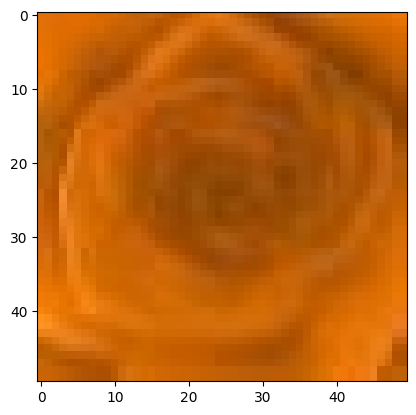

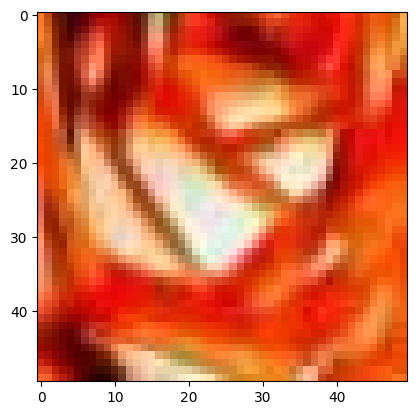

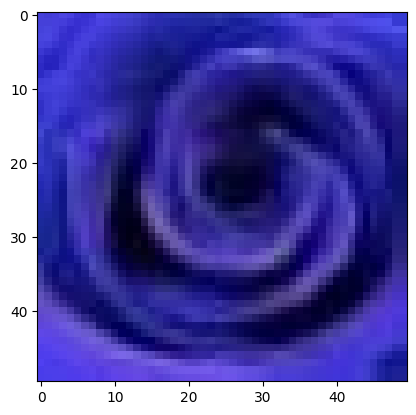

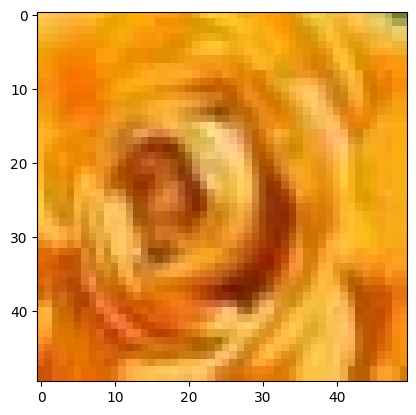

Cluster 2:


In [ ]:
import openpyxl
from openpyxl.utils import get_column_letter

# Define number of iterations and number of clusters
num_iterations = 5
num_clusters = 2

# Run K-means clustering
cluster_labels = k_means_clustering(cdf_dict, centroids, num_iterations)

# Save cluster labels to Excel file
wb = openpyxl.Workbook()
ws = wb.active
ws.title = "Cluster Labels"

# Write header row
ws.cell(row=1, column=1, value="Filename")
for i in range(num_iterations):
    ws.cell(row=1, column=i+2, value=f"Iteration {i+1}")

# Write data rows
for idx, file in enumerate(cluster_labels):
    row = idx + 2
    ws.cell(row=row, column=1, value=file)
    ws.cell(row=row, column=2, value=cluster_labels[file])

# Auto-fit columns
for col in ws.columns:
    column = col[0].column
    letter = get_column_letter(column)
    ws.column_dimensions[letter].auto_size = True

# Save workbook
wb.save("/content/drive/MyDrive/Colab Notebooks/folder program/cluster_labels.xlsx")

# View images per cluster
for i in range(num_clusters):
    print(f"Cluster {i+1}:")
    for file, cluster_label in cluster_labels.items():
        if cluster_label == i:
            img = cv2.imread(os.path.join(path, file))
            plt.imshow(img)
            plt.show()


Filename: MM 10.jpg
Shape: (7500,)
Dimension: 1
Filename: MM 2.jpg
Shape: (7500,)
Dimension: 1
Filename: MM 3.jpg
Shape: (7500,)
Dimension: 1
Filename: MM 4.jpg
Shape: (7500,)
Dimension: 1
Filename: MM 5.jpg
Shape: (7500,)
Dimension: 1
Filename: MM 6.jpg
Shape: (7500,)
Dimension: 1
Filename: MM 7.jpg
Shape: (7500,)
Dimension: 1
Filename: MM 8.jpg
Shape: (7500,)
Dimension: 1
Filename: MM 9.jpg
Shape: (7500,)
Dimension: 1
Filename: MB 10.jpg
Shape: (7500,)
Dimension: 1
Filename: MB 2.jpg
Shape: (7500,)
Dimension: 1
Filename: MB 3.jpg
Shape: (7500,)
Dimension: 1
Filename: MB 4.jpg
Shape: (7500,)
Dimension: 1
Filename: MB 5.jpg
Shape: (7500,)
Dimension: 1
Filename: MB 6.jpg
Shape: (7500,)
Dimension: 1
Filename: MB 7.jpg
Shape: (7500,)
Dimension: 1
Filename: MB 8.jpg
Shape: (7500,)
Dimension: 1
Filename: MB 9.jpg
Shape: (7500,)
Dimension: 1
Filename: MM 1.jpg
Shape: (7500,)
Dimension: 1
Filename: MB 1.jpg
Shape: (7500,)
Dimension: 1


/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Cluster 1:
Cluster 2:


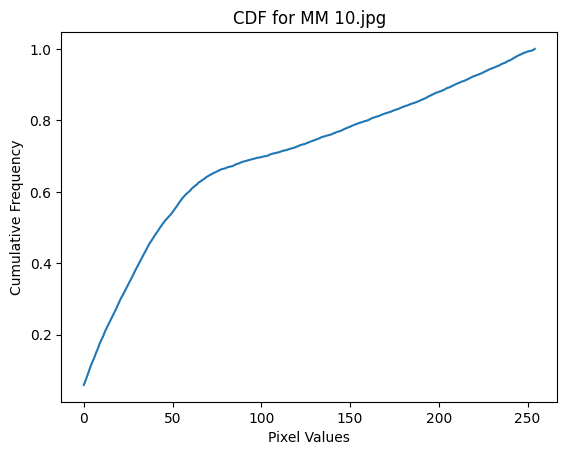

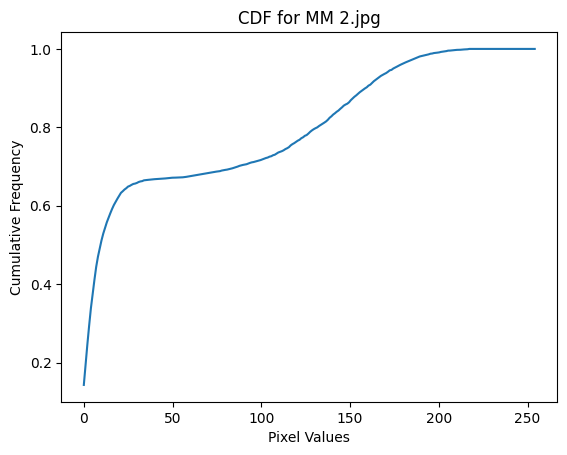

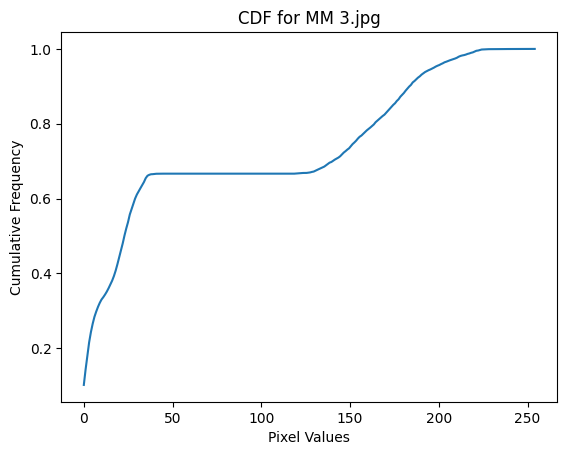

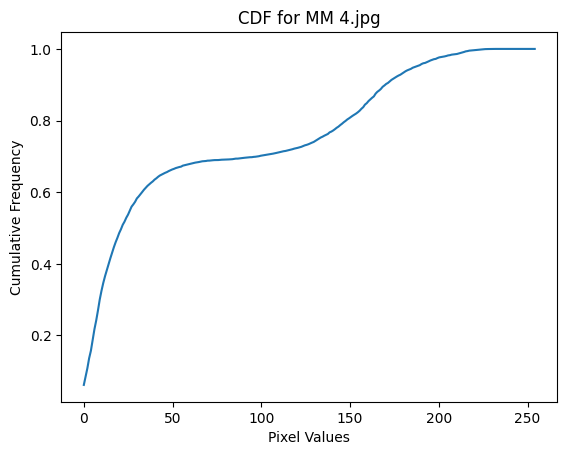

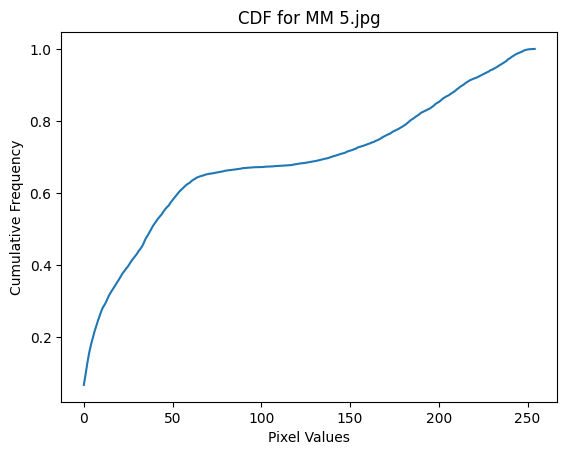

...

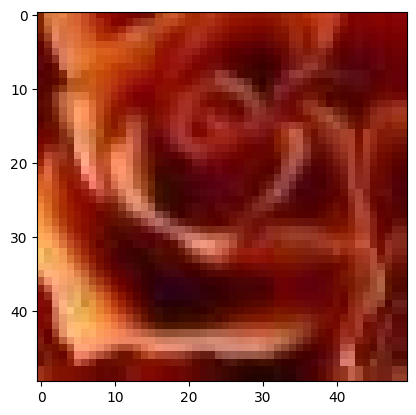

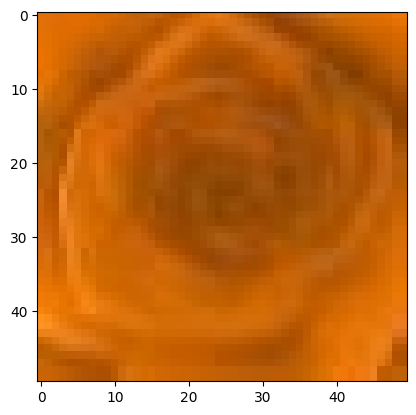

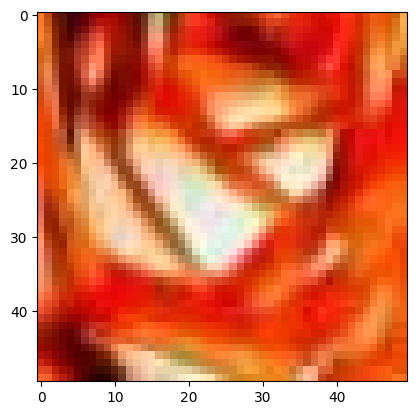

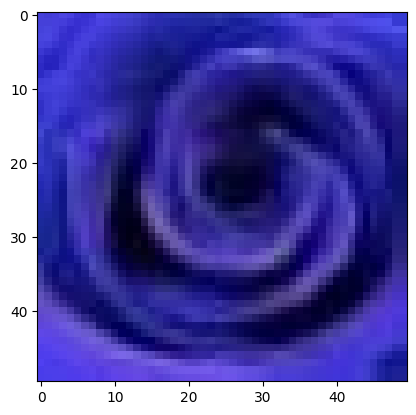

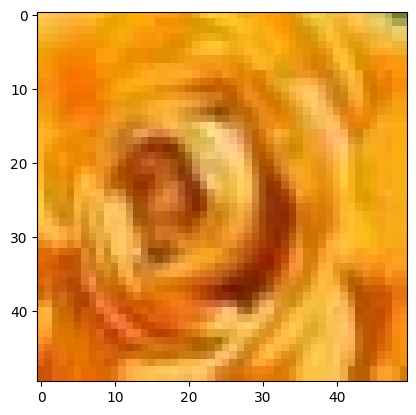

In [ ]:
import os
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import entropy

path = "/content/drive/MyDrive/Colab Notebooks/MAWAR MERAH dan BIRU"
files = os.listdir(path)

def process_image(filename):
    img = cv2.imread(os.path.join(path, filename))
    red, green, blue = cv2.split(img)
    row = np.concatenate((red.flatten(), green.flatten(), blue.flatten()))
    arr = np.array(row)
    shape = arr.shape
    dim = arr.ndim
    df = pd.DataFrame(row).transpose()
    df.insert(0, "filename", filename)
    freq, bins = np.histogram(row, bins=256, range=(0, 255))
    cdf = np.cumsum(freq) / len(row)
    df_freq = pd.DataFrame(freq).transpose()
    df_freq.columns = [f"freq_{i}" for i in range(256)]
    df_cdf = pd.DataFrame(cdf).transpose()
    df_cdf.columns = [f"CDF_{i}" for i in range(256)]
    fig, ax = plt.subplots()
    ax.plot(bins[:-1], cdf)
    ax.set_title(f"CDF for {filename}")
    ax.set_xlabel("Pixel Values")
    ax.set_ylabel("Cumulative Frequency")
    plt.savefig("/content/drive/MyDrive/Colab Notebooks/folder program/"f"{filename}_CDF.png")
    return pd.concat([df, df_freq, df_cdf], axis=0), shape, dim, cdf

data = pd.DataFrame()
cdf_dict = {}
for file in files:
    if file.endswith(".jpg"):
        df, shape, dim, cdf = process_image(file)
        print(f"Filename: {file}")
        print(f"Shape: {shape}")
        print(f"Dimension: {dim}")
        data = pd.concat([data, df], axis=0)
        cdf_dict[file] = cdf


red1_cdf = cdf_dict["MM 1.jpg"] / np.max(cdf_dict["MM 1.jpg"])
blue1_cdf = cdf_dict["MB 1.jpg"] / np.max(cdf_dict["MB 1.jpg"])

# Create initial centroids using CDF of Red 1 and Blue 1 images
centroids = [red1_cdf, blue1_cdf]

# Implement K-means clustering
from scipy.spatial.distance import jensenshannon

def k_means_clustering(cdf_dict, centroids, num_iterations):
    num_clusters = len(centroids)
    cluster_labels = {file: None for file in cdf_dict.keys() if file.endswith(".jpg")}
    for i in range(num_iterations):
        clusters = [[] for _ in range(num_clusters)]
        for file, cdf in cdf_dict.items():
            if file.endswith(".jpg"):
                js_divergences = [jensenshannon(cdf, centroid) for centroid in centroids]
                closest_centroid_idx = np.argmin(js_divergences)
                clusters[closest_centroid_idx].append(file)
                cluster_labels[file] = closest_centroid_idx
        centroids = [np.mean([cdf_dict[file] for file in cluster]) for cluster in clusters]
    return cluster_labels


import openpyxl
from openpyxl.utils import get_column_letter

# Define number of iterations and number of clusters
num_iterations = 5
num_clusters = 2

# Run K-means clustering
cluster_labels = k_means_clustering(cdf_dict, centroids, num_iterations)

# Save cluster labels to Excel file
wb = openpyxl.Workbook()
ws = wb.active
ws.title = "Cluster Labels"

# Write header row
ws.cell(row=1, column=1, value="Filename")
for i in range(num_iterations):
    ws.cell(row=1, column=i+2, value=f"Iteration {i+1}")

# Write data rows
for idx, file in enumerate(cluster_labels):
    row = idx + 2
    ws.cell(row=row, column=1, value=file)
    ws.cell(row=row, column=2, value=cluster_labels[file])

# Auto-fit columns
for col in ws.columns:
    column = col[0].column
    letter = get_column_letter(column)
    ws.column_dimensions[letter].auto_size = True

# Save workbook
wb.save("/content/drive/MyDrive/Colab Notebooks/folder program/cluster_JSlabels.xlsx")

# View images per cluster
for i in range(num_clusters):
    print(f"Cluster {i+1}:")
    for file, cluster_label in cluster_labels.items():
        if cluster_label == i:
            img = cv2.imread(os.path.join(path, file))
            plt.imshow(img)
            plt.show()


Filename: MM 1.jpg
Shape: (7500,)
Dimension: 1
Filename: MM 10.jpg
Shape: (7500,)
Dimension: 1
Filename: MM 2.jpg
Shape: (7500,)
Dimension: 1
Filename: MM 3.jpg
Shape: (7500,)
Dimension: 1
Filename: MM 4.jpg
Shape: (7500,)
Dimension: 1
Filename: MM 5.jpg
Shape: (7500,)
Dimension: 1
Filename: MM 6.jpg
Shape: (7500,)
Dimension: 1
Filename: MM 7.jpg
Shape: (7500,)
Dimension: 1
Filename: MM 8.jpg
Shape: (7500,)
Dimension: 1
Filename: MM 9.jpg
Shape: (7500,)
Dimension: 1
Filename: MB 1.jpg
Shape: (7500,)
Dimension: 1
Filename: MB 10.jpg
Shape: (7500,)
Dimension: 1
Filename: MB 2.jpg
Shape: (7500,)
Dimension: 1
Filename: MB 3.jpg
Shape: (7500,)
Dimension: 1
Filename: MB 4.jpg
Shape: (7500,)
Dimension: 1
Filename: MB 5.jpg
Shape: (7500,)
Dimension: 1
Filename: MB 6.jpg
Shape: (7500,)
Dimension: 1
Filename: MB 7.jpg
Shape: (7500,)
Dimension: 1
Filename: MB 8.jpg
Shape: (7500,)
Dimension: 1
Filename: MB 9.jpg
Shape: (7500,)
Dimension: 1
KS statistic between Red 1 and other images:
{'MM 1.jpg': 

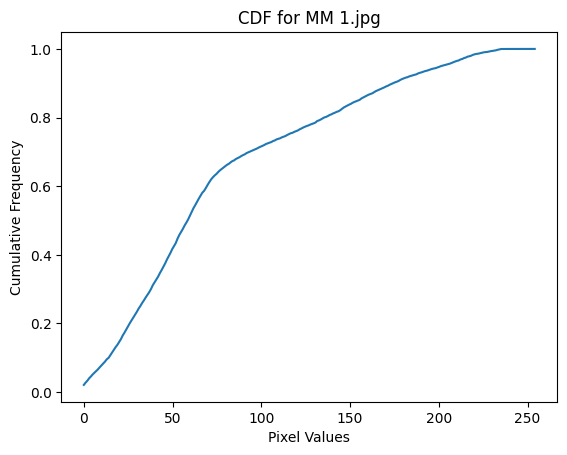

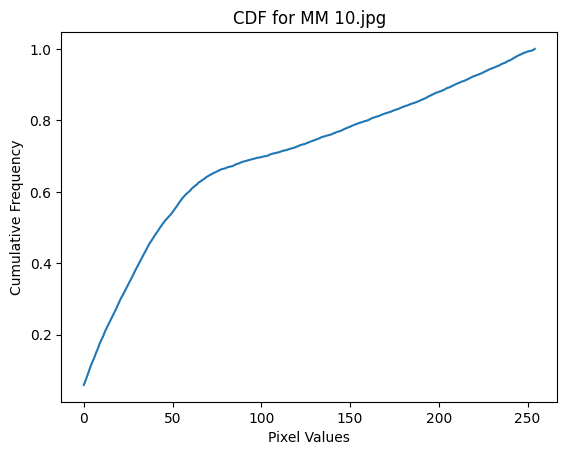

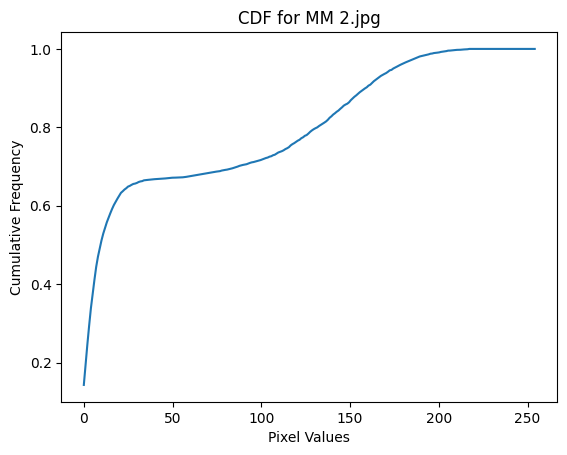

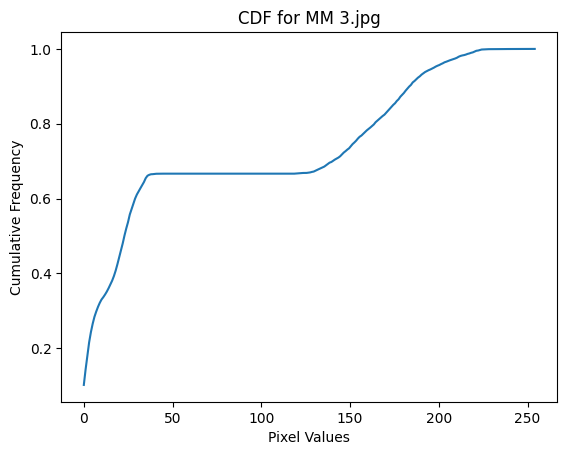

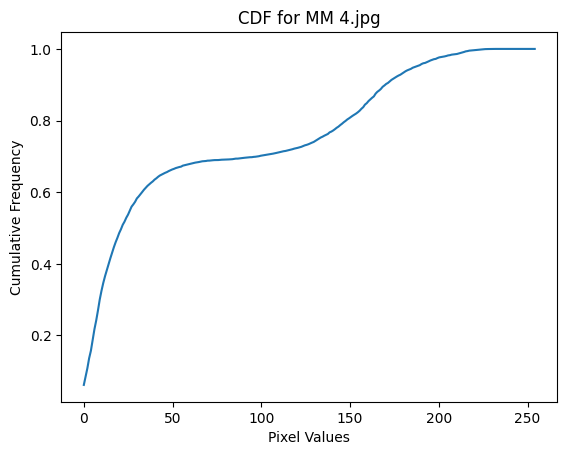

...

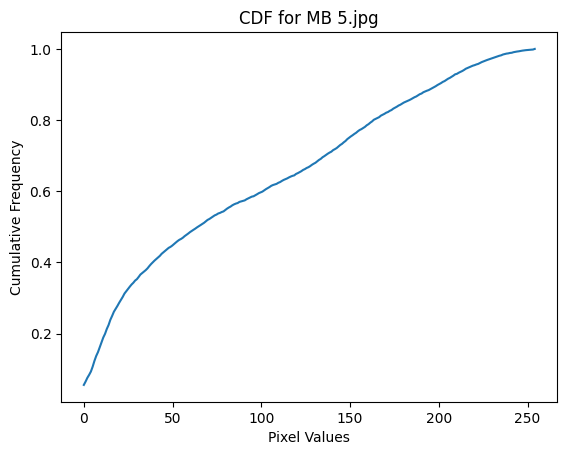

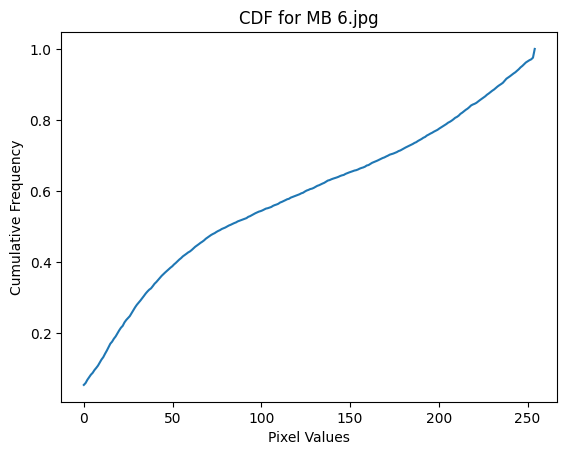

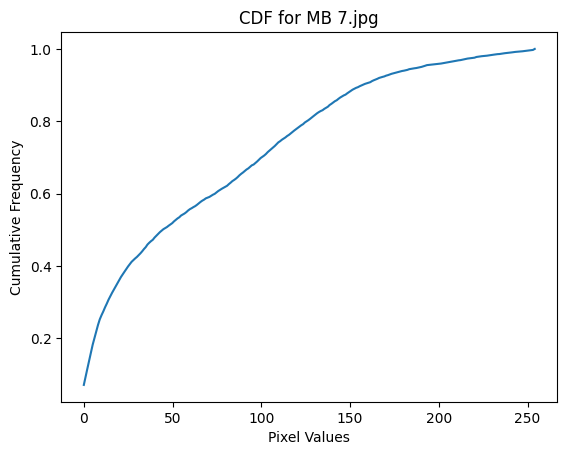

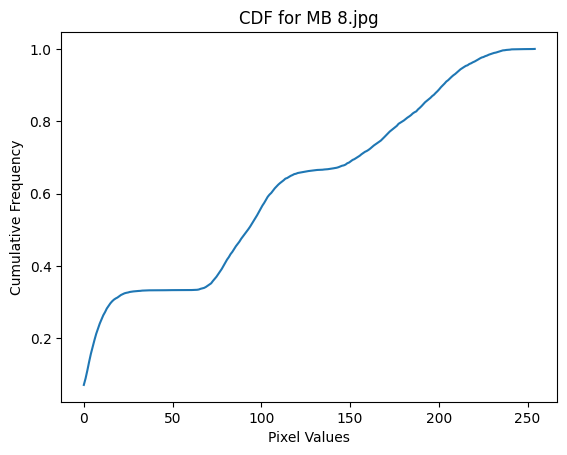

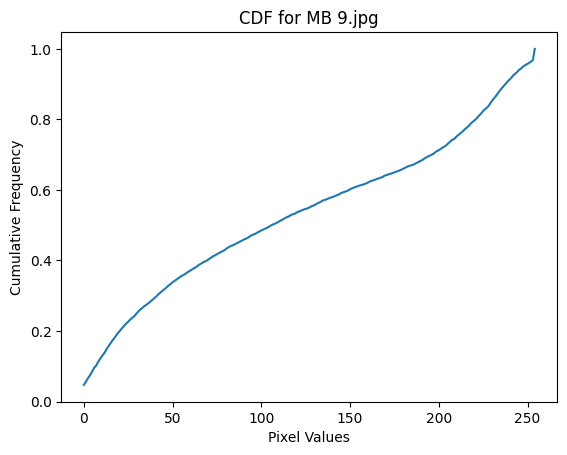

In [ ]:
import os
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import entropy, kstest

path = "/content/drive/MyDrive/Colab Notebooks/MAWAR MERAH dan BIRU"
files = os.listdir(path)

def process_image(filename):
    img = cv2.imread(os.path.join(path, filename))
    red, green, blue = cv2.split(img)
    row = np.concatenate((red.flatten(), green.flatten(), blue.flatten()))
    arr = np.array(row)
    shape = arr.shape
    dim = arr.ndim
    df = pd.DataFrame(row).transpose()
    df.insert(0, "filename", filename)
    freq, bins = np.histogram(row, bins=256, range=(0, 255))
    cdf = np.cumsum(freq) / len(row)
    df_freq = pd.DataFrame(freq).transpose()
    df_freq.columns = [f"freq_{i}" for i in range(256)]
    df_freq.insert(0, "filename", filename)  # add filename column
    df_cdf = pd.DataFrame(cdf).transpose()
    df_cdf.columns = [f"CDF_{i}" for i in range(256)]
    fig, ax = plt.subplots()
    ax.plot(bins[:-1], cdf)
    ax.set_title(f"CDF for {filename}")
    ax.set_xlabel("Pixel Values")
    ax.set_ylabel("Cumulative Frequency")
    plt.savefig("/content/drive/MyDrive/Colab Notebooks/folder program/"f"{filename}_CDF.png")
    return pd.concat([df, df_freq, df_cdf], axis=0), shape, dim, freq


data = pd.DataFrame()
freq_dict = {}
for file in files:
    if file.endswith(".jpg"):
        df, shape, dim, freq = process_image(file)
        print(f"Filename: {file}")
        print(f"Shape: {shape}")
        print(f"Dimension: {dim}")
        data = pd.concat([data, df], axis=0)
        freq_dict[file] = freq

# Calculate KS statistic between Red 1 and all other images
red1_freq = freq_dict["MM 1.jpg"]
red1_ks_statistic = {}
for file, freq in freq_dict.items():
    if file.endswith(".jpg"):
        ks_stat = kstest(red1_freq, freq)[0]
        red1_ks_statistic[file] = ks_stat

print("KS statistic between Red 1 and other images:")
print(red1_ks_statistic)

# Calculate KS statistic between Blue 1 and all other images
blue1_freq = freq_dict["MB 1.jpg"]
blue1_ks_statistic = {}
for file, freq in freq_dict.items():
    if file.endswith(".jpg"):
        ks_stat = kstest(blue1_freq, freq)[0]
        blue1_ks_statistic[file] = ks_stat

print("KS statistic between Blue 1 and other images:")
print(blue1_ks_statistic)

data.to_excel("/content/drive/MyDrive/Colab Notebooks/folder program/output1Dmawar.xlsx", index=False)


In [ ]:
# Create DataFrame for Red 1 KL divergence
red1_ks_test_df = pd.DataFrame.from_dict(red1_ks_statistic, orient="index", columns=["Red 1 KS Test"])
red1_ks_test_df.index.name = "filename"

# Create DataFrame for Blue 1 KL divergence
blue1_ks_test_df = pd.DataFrame.from_dict(blue1_ks_statistic, orient="index", columns=["Blue 1 KS Test"])
blue1_ks_test_df.index.name = "filename"

# Merge the two DataFrames
ks_test_df = red1_ks_test_df.join(blue1_ks_test_df)

# Save to Excel
ks_test_df.to_excel("/content/drive/MyDrive/Colab Notebooks/folder program/ks_test.xlsx")

In [ ]:
import os
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import entropy

def resize_image(img, width, height):
    resized_img = cv2.resize(img, (width, height))
    return resized_img

def extract_channels(img):
    red, green, blue = cv2.split(img)
    return red, green, blue

def calculate_cdf(channel):
    hist, bins = np.histogram(channel.flatten(), bins=256, range=(0, 255))
    cdf = np.cumsum(hist) / float(len(channel.flatten()))
    return cdf

def calculate_joint_cdf(cdf_red, cdf_green, cdf_blue):
    joint_cdf = cdf_red * cdf_green * cdf_blue
    return joint_cdf

def calculate_js_divergence(p, q):
    m = (p + q) / 2.0
    js_div = (entropy(p, m) + entropy(q, m)) / 2.0
    return js_div

def calculate_distance(cdf1, cdf2):
    return calculate_js_divergence(cdf1, cdf2)

def initialize_centroids(cdf_dict, image_names):
    centroid1 = cdf_dict[image_names[0]]
    centroid2 = cdf_dict[image_names[1]]
    return [centroid1, centroid2]

def k_means_clustering(cdf_dict, centroids, num_iterations):
    num_clusters = len(centroids)
    cluster_labels = {filename: None for filename in cdf_dict.keys()}

    for _ in range(num_iterations):
        clusters = [[] for _ in range(num_clusters)]

        for filename, cdf in cdf_dict.items():
            distances = [calculate_distance(cdf, centroid) for centroid in centroids]
            closest_centroid_idx = np.argmin(distances)
            clusters[closest_centroid_idx].append(filename)
            cluster_labels[filename] = closest_centroid_idx

        centroids = [np.mean([cdf_dict[filename] for filename in cluster]) for cluster in clusters]

    return cluster_labels

def process_images(path, output_path, width, height, num_iterations):
    files = os.listdir(path)
    image_names = []
    cdf_dict = {}

    for filename in files:
        if filename.endswith(".jpg"):
            img = cv2.imread(os.path.join(path, filename))
            resized_img = resize_image(img, width, height)
            red, green, blue = extract_channels(resized_img)
            cdf_red = calculate_cdf(red)
            cdf_green = calculate_cdf(green)
            cdf_blue = calculate_cdf(blue)
            joint_cdf = calculate_joint_cdf(cdf_red, cdf_green, cdf_blue)
            cdf_dict[filename] = joint_cdf
            image_names.append(filename)

    centroids = initialize_centroids(cdf_dict, image_names)
    cluster_labels = k_means_clustering(cdf_dict, centroids, num_iterations)

    for cluster_id in set(cluster_labels.values()):
        cluster_path = os.path.join(output_path, f"Cluster_{cluster_id+1}")
        os.makedirs(cluster_path, exist_ok=True)

    for filename, cluster_id in cluster_labels.items():
        img = cv2.imread(os.path.join(path, filename))
        cluster_path = os.path.join(output_path, f"Cluster_{cluster_id+1}")
        cv2.imwrite(os.path.join(cluster_path, filename), img)

    # Display images per cluster
    for cluster_id in set(cluster_labels.values()):
        cluster_path = os.path.join(output_path, f"Cluster_{cluster_id+1}")
        cluster_files = os.listdir(cluster_path)

        print(f"Cluster {cluster_id+1}:")
        for filename in cluster_files:
            img = cv2.imread(os.path.join(cluster_path, filename))
            plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
            plt.axis("off")
            plt.show()

# Example usage
input_path = "/content/drive/MyDrive/Colab Notebooks/bunga"
output_path = "/content/drive/MyDrive/Colab Notebooks/bunga"
width = 50


In [ ]:
import os
import cv2
import numpy as np

def resize_image(img, width, height):
    resized_img = cv2.resize(img, (width, height))
    return resized_img

def extract_channels(img):
    red, green, blue = cv2.split(img)
    return red, green, blue

def calculate_relative_frequency(channel):
    hist, bins = np.histogram(channel.flatten(), bins=256, range=(0, 256))
    frequency = hist / float(hist.sum())
    return frequency

def calculate_joint_pdf(red_freq, green_freq, blue_freq):
    joint_pdf = np.zeros((5, 5, 5))

    for r in range(5):
        for g in range(5):
            for b in range(5):
                r_range = np.arange(r*50, (r+1)*50)
                g_range = np.arange(g*50, (g+1)*50)
                b_range = np.arange(b*50, (b+1)*50)
                joint_pdf[r, g, b] = np.sum(red_freq[r_range]) * np.sum(green_freq[g_range]) * np.sum(blue_freq[b_range])

    return joint_pdf

def print_joint_pdf(joint_pdf, filename):
    print(f'Joint PDF for {filename}:')
    print(joint_pdf)
    print('\n')

def process_images(input_path, width, height):
    files = os.listdir(input_path)

    for filename in files:
        if filename.endswith(".jpg"):
            img = cv2.imread(os.path.join(input_path, filename))
            red_freq = np.zeros(256)
            green_freq = np.zeros(256)
            blue_freq = np.zeros(256)

            resized_img = resize_image(img, width, height)
            red, green, blue = extract_channels(resized_img)

            red_freq = calculate_relative_frequency(red)
            green_freq = calculate_relative_frequency(green)
            blue_freq = calculate_relative_frequency(blue)

            joint_pdf = calculate_joint_pdf(red_freq, green_freq, blue_freq)
            print_joint_pdf(joint_pdf, filename)

# Example usage
input_path = "/content/drive/MyDrive/Colab Notebooks/bunga"
width = 50
height = 50

process_images(input_path, width, height)


Joint PDF for O1.jpg:
[[[0.00000000e+00 4.70016000e-07 7.05024000e-05 1.76256000e-04
   2.37123072e-04]
  [0.00000000e+00 5.65248000e-07 8.47872000e-05 2.11968000e-04
   2.85167616e-04]
  [0.00000000e+00 2.28096000e-07 3.42144000e-05 8.55360000e-05
   1.15074432e-04]
  [0.00000000e+00 2.21184000e-07 3.31776000e-05 8.29440000e-05
   1.11587328e-04]
  [0.00000000e+00 2.88000000e-07 4.32000000e-05 1.08000000e-04
   1.45296000e-04]]

 [[0.00000000e+00 2.25607680e-05 3.38411520e-03 8.46028800e-03
   1.13819075e-02]
  [0.00000000e+00 2.71319040e-05 4.06978560e-03 1.01744640e-02
   1.36880456e-02]
  [0.00000000e+00 1.09486080e-05 1.64229120e-03 4.10572800e-03
   5.52357274e-03]
  [0.00000000e+00 1.06168320e-05 1.59252480e-03 3.98131200e-03
   5.35619174e-03]
  [0.00000000e+00 1.38240000e-05 2.07360000e-03 5.18400000e-03
   6.97420800e-03]]

 [[0.00000000e+00 4.66099200e-05 6.99148800e-03 1.74787200e-02
   2.35147046e-02]
  [0.00000000e+00 5.60537600e-05 8.40806400e-03 2.10201600e-02
   2.8279

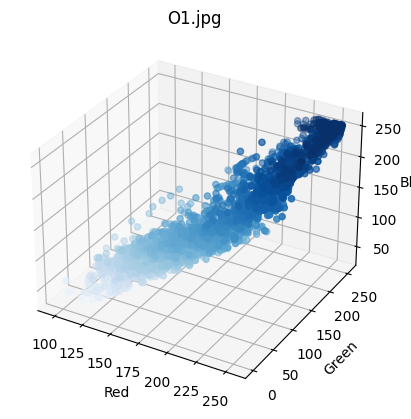

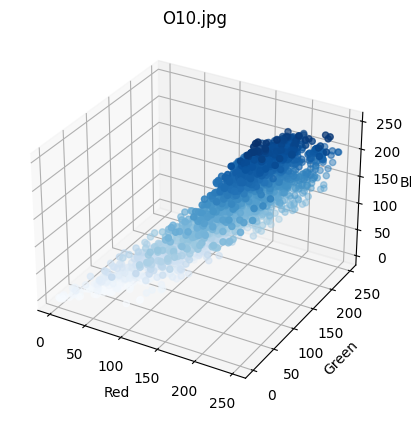

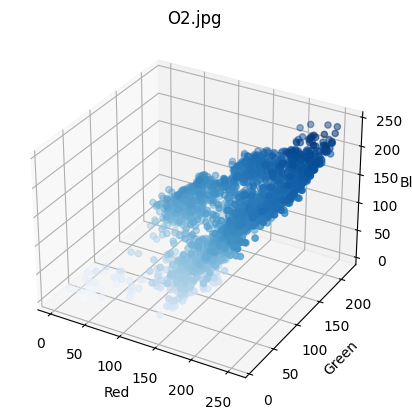

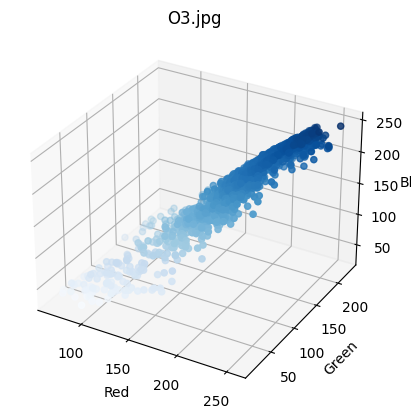

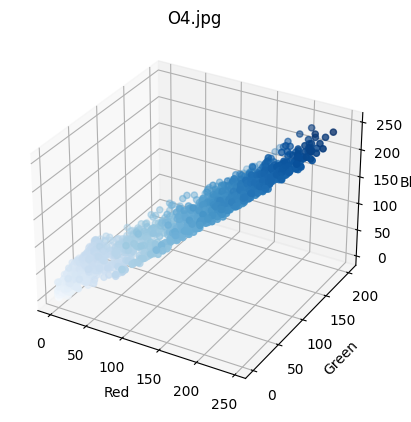

...

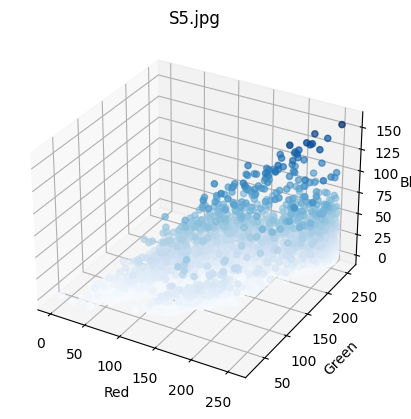

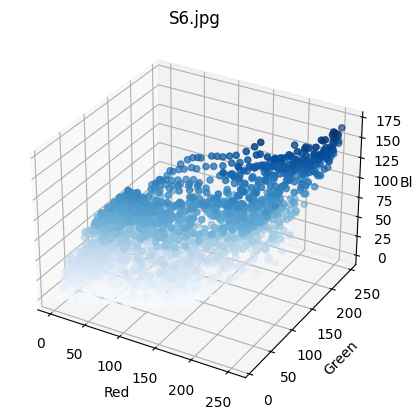

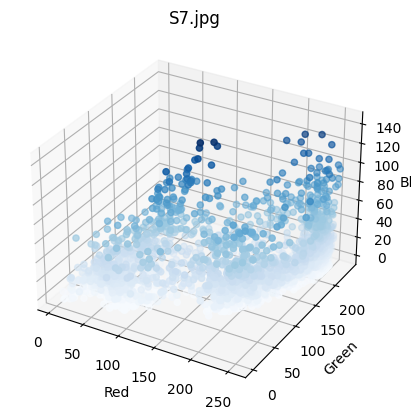

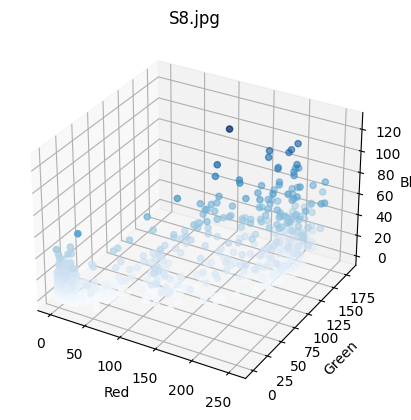

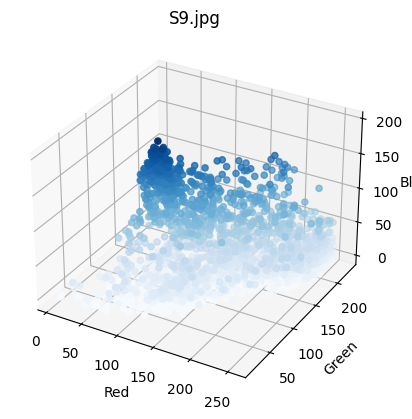

In [ ]:
import os
from PIL import Image
import numpy as np
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt

# Set the directory containing the images
image_folder = '/content/drive/MyDrive/Colab Notebooks/bunga'

# Set the desired size for resizing the images
target_size = (50, 50)

# Initialize lists to store the pixel values for each channel
red_channel = []
green_channel = []
blue_channel = []

# Iterate over each file in the image folder
for filename in os.listdir(image_folder):
    if filename.endswith('.png') or filename.endswith('.jpg'):
        # Open the image
        image_path = os.path.join(image_folder, filename)
        image = Image.open(image_path)

        # Resize the image
        resized_image = image.resize(target_size)

        # Extract pixel RGB values
        pixels = np.array(resized_image)
        red_values = pixels[:, :, 0].flatten()  # Flatten the 2D array
        green_values = pixels[:, :, 1].flatten()
        blue_values = pixels[:, :, 2].flatten()

        # Add the values to the respective lists
        red_channel.extend(red_values)
        green_channel.extend(green_values)
        blue_channel.extend(blue_values)

        # Create 3D scatter plot for each image
        fig = plt.figure()
        ax = fig.add_subplot(111, projection='3d')

        # Plot the points with their respective colors
        ax.scatter(red_values, green_values, blue_values, c=blue_values, cmap='Blues')

        # Set labels for the axes
        ax.set_xlabel('Red Channel')
        ax.set_ylabel('Green Channel')
        ax.set_zlabel('Blue Channel')

        # Set the title with the filename
        ax.set_title(filename)

        # Show the plot
        plt.show()


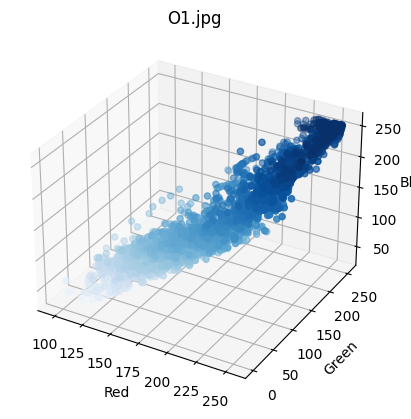

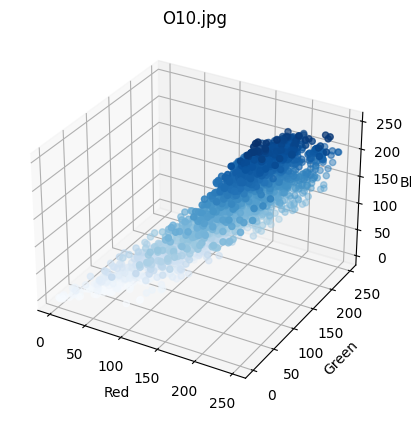

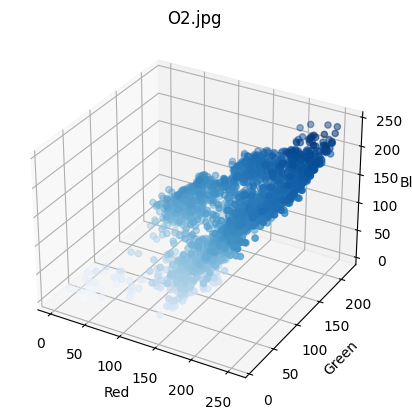

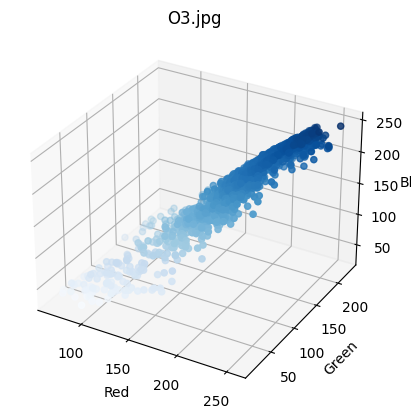

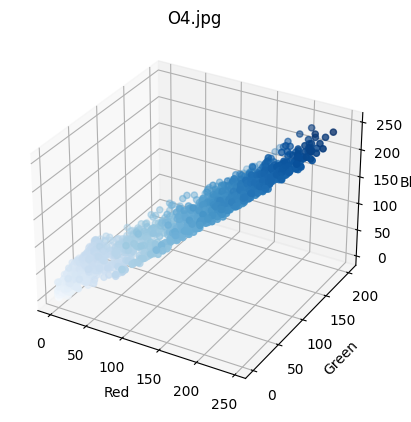

...

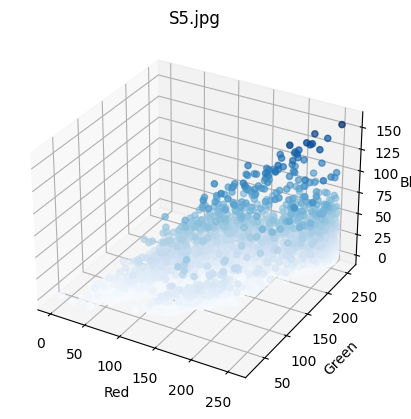

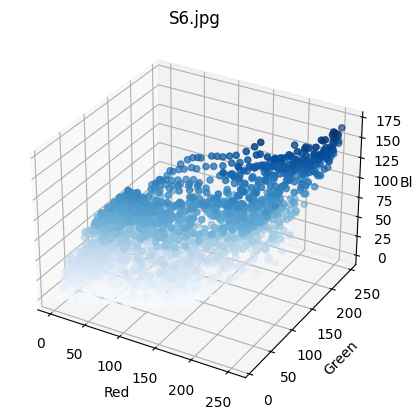

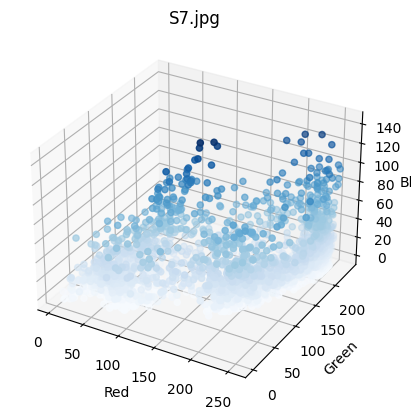

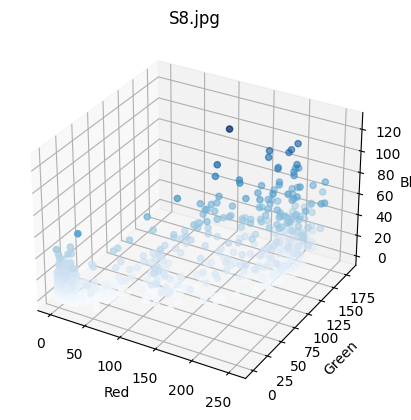

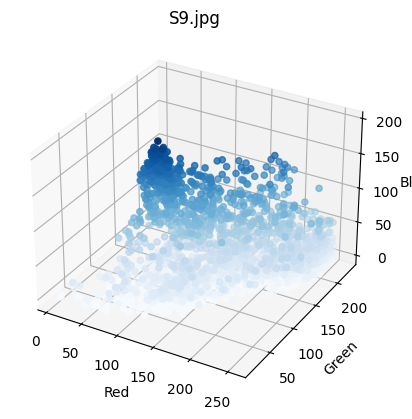

In [ ]:
import os
from PIL import Image
import numpy as np
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt

# Set the directory containing the images
image_folder = '/content/drive/MyDrive/Colab Notebooks/bunga'

# Set the desired size for resizing the images
target_size = (50, 50)

# Initialize lists to store the pixel values for each channel
red_channel = []
green_channel = []
blue_channel = []

# Iterate over each file in the image folder
for filename in os.listdir(image_folder):
    if filename.endswith('.png') or filename.endswith('.jpg'):
        # Open the image
        image_path = os.path.join(image_folder, filename)
        image = Image.open(image_path)

        # Resize the image
        resized_image = image.resize(target_size)

        # Extract pixel RGB values
        pixels = np.array(resized_image)
        red_values = pixels[:, :, 0].flatten()  # Flatten the 2D array
        green_values = pixels[:, :, 1].flatten()
        blue_values = pixels[:, :, 2].flatten()

        # Add the values to the respective lists
        red_channel.extend(red_values)
        green_channel.extend(green_values)
        blue_channel.extend(blue_values)

        # Calculate joint probability density function
        histogram, _, _ = np.histogram2d(red_values, green_values, bins=256, range=[[0, 255], [0, 255]])
        joint_pdf = histogram / float(np.sum(histogram))

        # Create a new figure for each filename
        fig = plt.figure()
        ax = fig.add_subplot(111, projection='3d')

        # Plot the points with their respective colors
        ax.scatter(red_values, green_values, blue_values, c=blue_values, cmap='Blues')

        # Set labels for the axes
        ax.set_xlabel('Red Channel')
        ax.set_ylabel('Green Channel')
        ax.set_zlabel('Blue Channel')

        # Set the title as the filename
        ax.set_title(filename)

        # Show the plot
        plt.show()


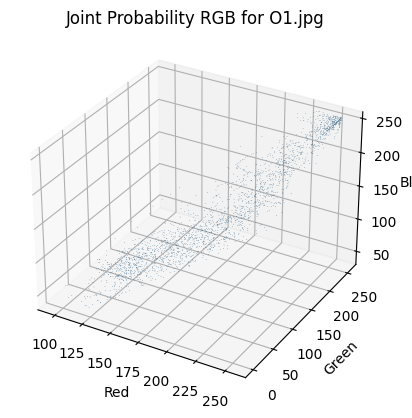

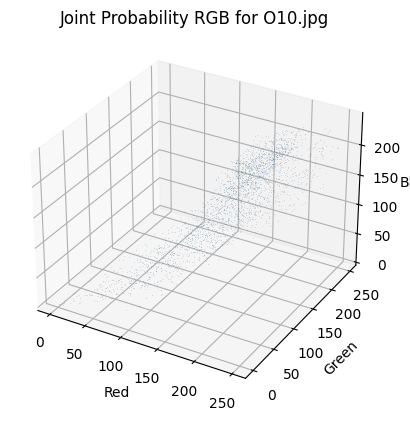

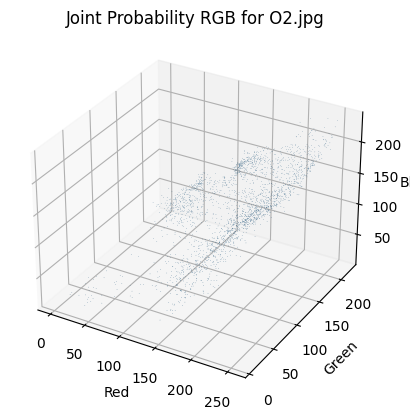

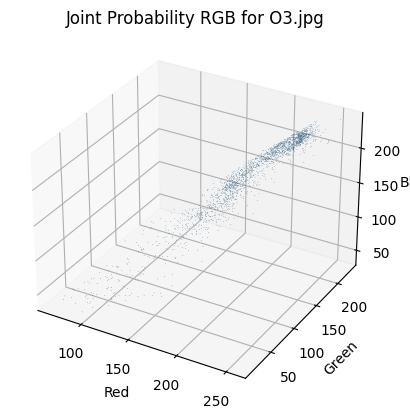

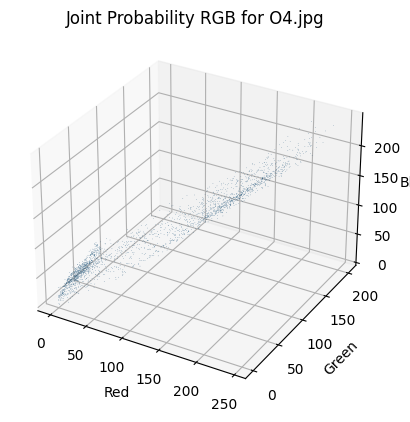

...

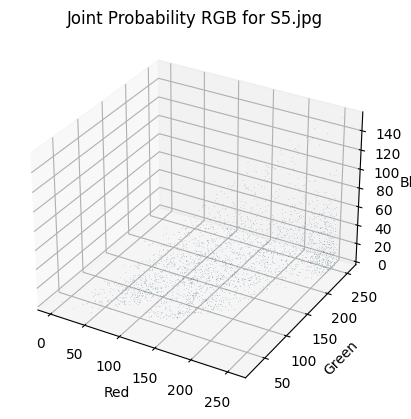

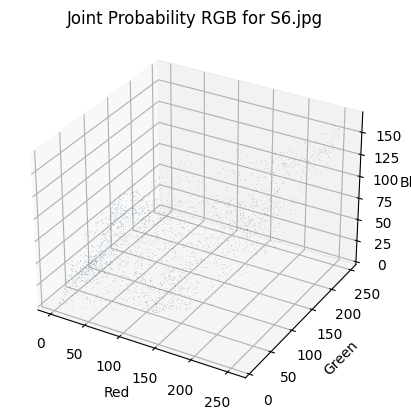

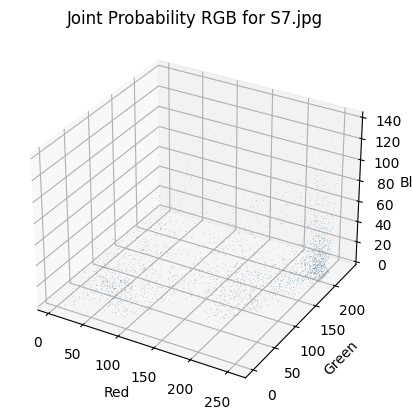

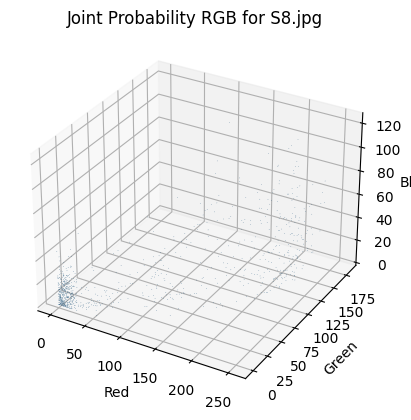

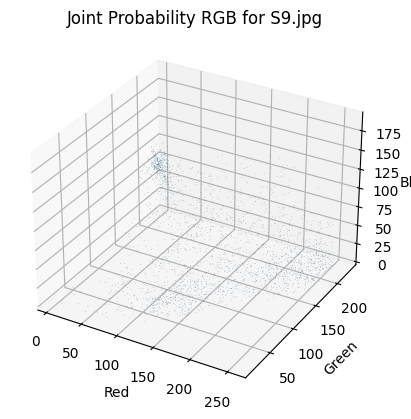

In [ ]:
import os
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

def resize_image(image, size=(50, 50)):
    return image.resize(size)

def extract_rgb(image):
    return np.array(image).reshape(-1, 3)

def calculate_relative_frequency(data):
    unique, counts = np.unique(data, return_counts=True, axis=0)
    relative_freq = counts / np.sum(counts)
    return unique, relative_freq

def plot_joint_probability(unique, relative_freq, filename):
    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')
    x, y, z = unique[:, 0], unique[:, 1], unique[:, 2]
    ax.bar3d(x, y, z, 0.5, 0.5, relative_freq)
    ax.set_xlabel('Red')
    ax.set_ylabel('Green')
    ax.set_zlabel('Blue')
    ax.set_title(f'Joint Probability RGB for {filename}')
    plt.show()

def process_image_folder(folder_path):
    for filename in os.listdir(folder_path):
        if filename.endswith(".jpg") or filename.endswith(".png"):
            file_path = os.path.join(folder_path, filename)
            image = Image.open(file_path)
            resized_image = resize_image(image)
            rgb_data = extract_rgb(resized_image)
            unique, relative_freq = calculate_relative_frequency(rgb_data)
            plot_joint_probability(unique, relative_freq, filename)

# Provide the path to your image folder
image_folder = "/content/drive/MyDrive/Colab Notebooks/bunga"
process_image_folder(image_folder)


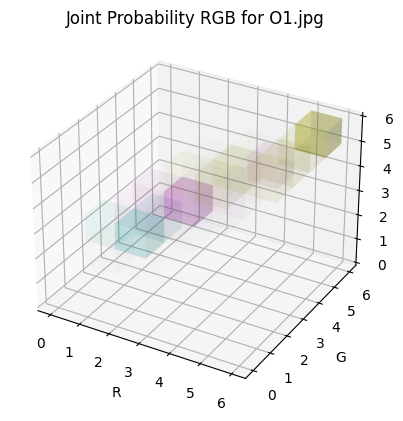

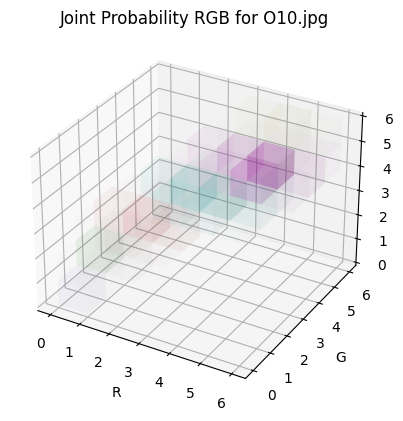

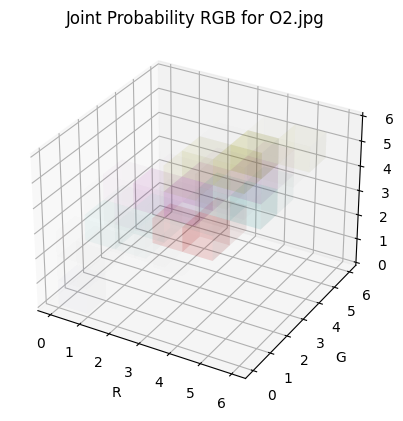

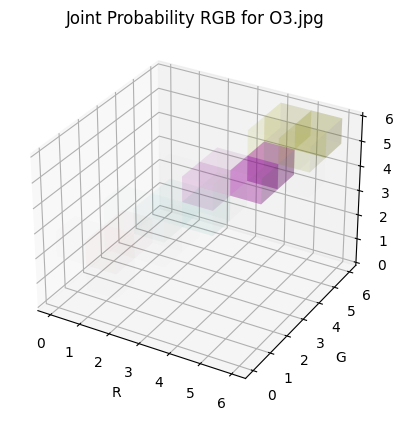

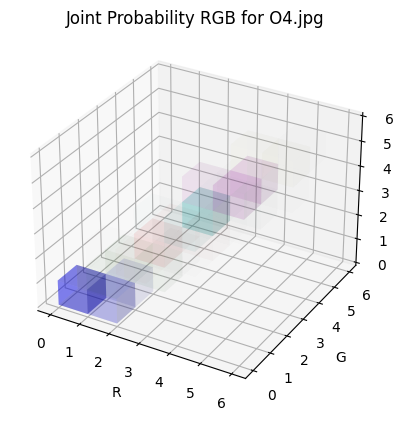

...

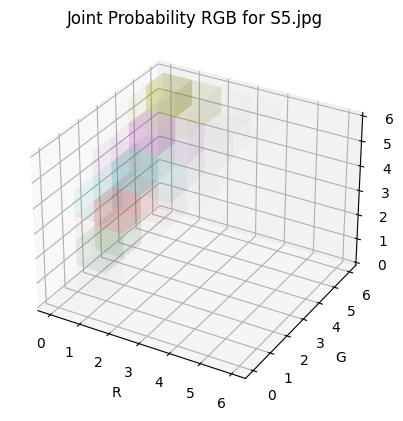

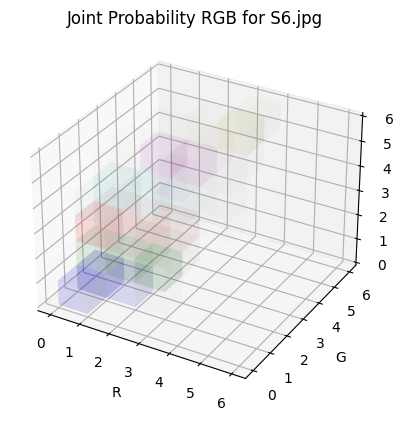

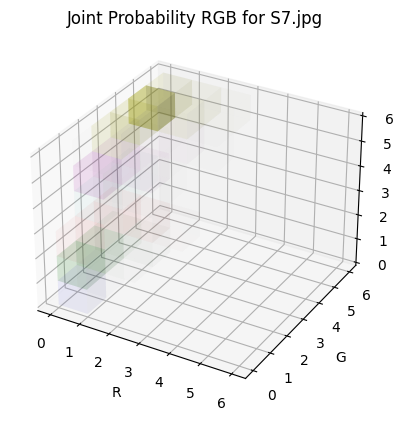

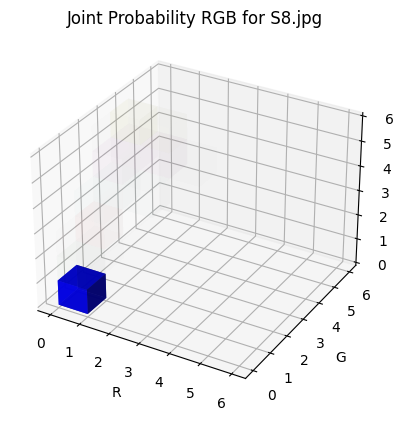

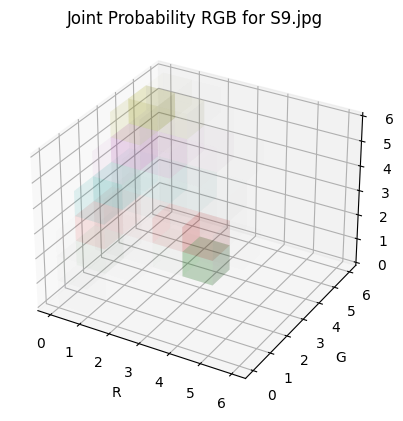

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt

def process_image(image_path):
    # Load image
    image = cv2.imread(image_path)

    # Resize image to 50x50
    image = cv2.resize(image, (50, 50))

    # Split image into RGB channels
    b, g, r = cv2.split(image)

    # Calculate frequency relative for each channel with 6 bins
    hist_b = cv2.calcHist([b], [0], None, [6], [0, 256]) / (50 * 50)
    hist_g = cv2.calcHist([g], [0], None, [6], [0, 256]) / (50 * 50)
    hist_r = cv2.calcHist([r], [0], None, [6], [0, 256]) / (50 * 50)

    # Joint probability function for RGB frequencies
    joint_prob = np.zeros((6, 6, 6))
    for i in range(50):
        for j in range(50):
            b_idx = min(b[i, j] // 42, 5)
            g_idx = min(g[i, j] // 42, 5)
            r_idx = min(r[i, j] // 42, 5)
            joint_prob[b_idx, g_idx, r_idx] += 1

    joint_prob /= (50 * 50)

    return hist_r, hist_g, hist_b, joint_prob

def plot_joint_probability(joint_prob, filename):
    # Create 3D histogram plot for joint probability
    x, y, z = np.indices((6, 6, 6))
    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')

    colors = ['b', 'g', 'r', 'c', 'm', 'y']  # Colors for each channel

    for i in range(6):
        for j in range(6):
            for k in range(6):
                ax.bar3d(i, j, k, 1, 1, 1, color=colors[k], alpha=1.0 * joint_prob[i, j, k])

    ax.set_xlabel('R')
    ax.set_ylabel('G')
    ax.set_zlabel('B')
    ax.set_title('Joint Probability RGB for ' + filename)
    plt.show()

# Path to the folder containing the images
folder_path = '/content/drive/MyDrive/Colab Notebooks/bunga'

# Iterate over the images in the folder
for filename in os.listdir(folder_path):
    if filename.endswith('.jpg') or filename.endswith('.png'):
        image_path = os.path.join(folder_path, filename)
        hist_r, hist_g, hist_b, joint_prob = process_image(image_path)

        # Display the joint probability plot with colored bars
        plot_joint_probability(joint_prob, filename)


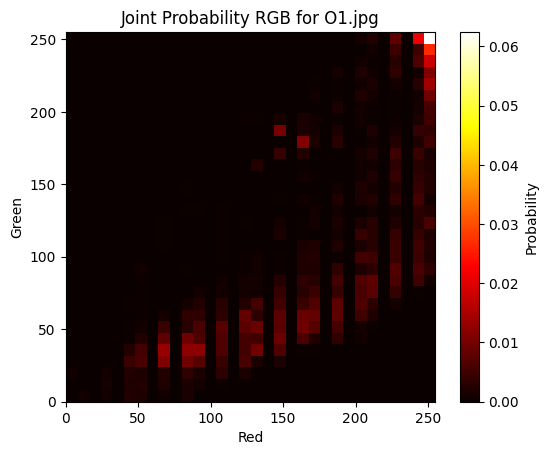

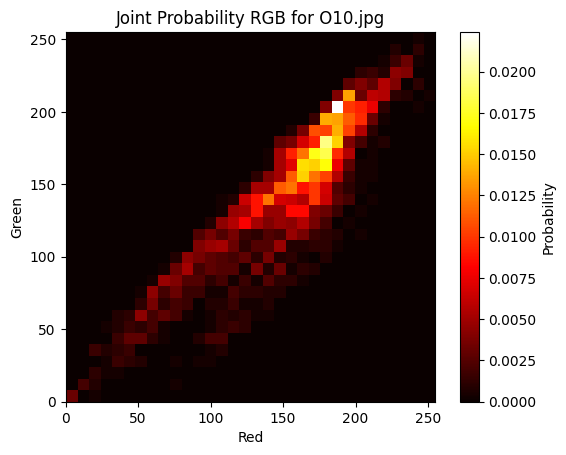

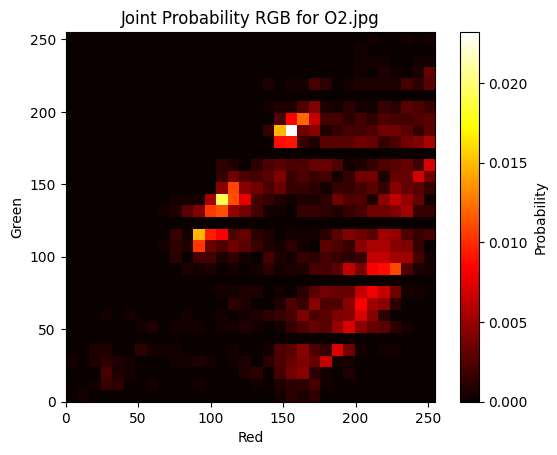

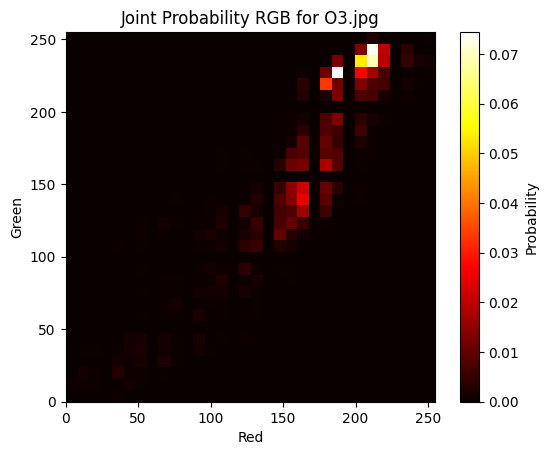

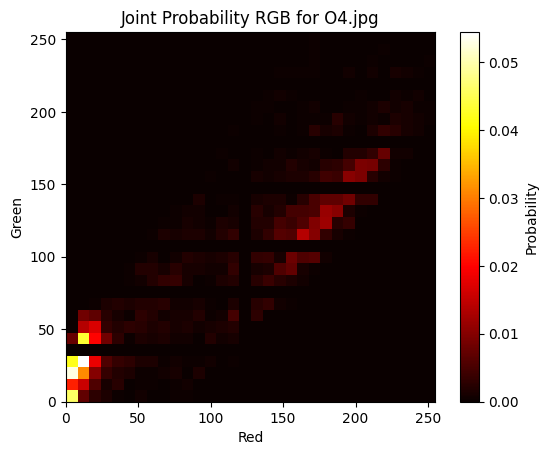

...

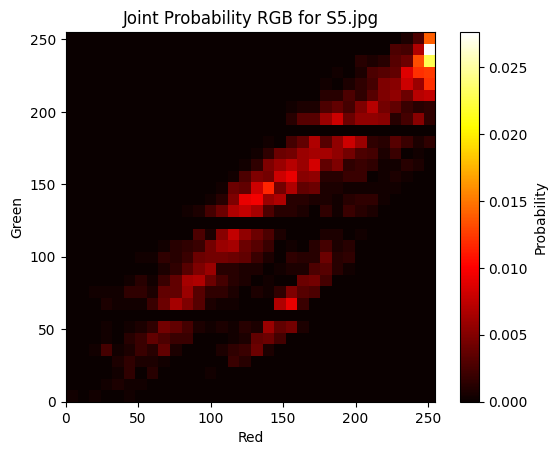

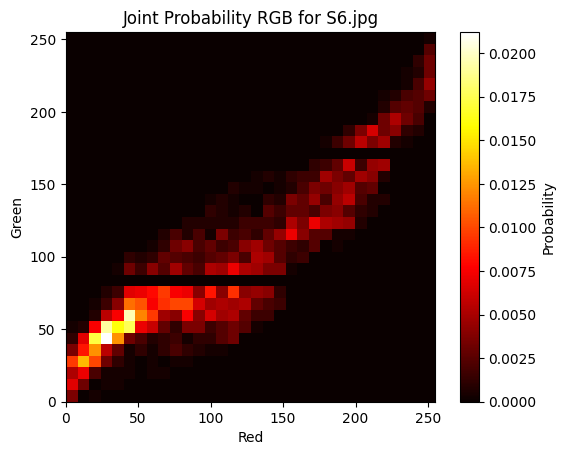

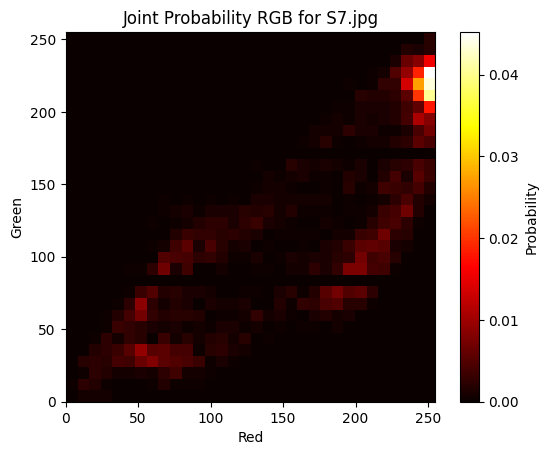

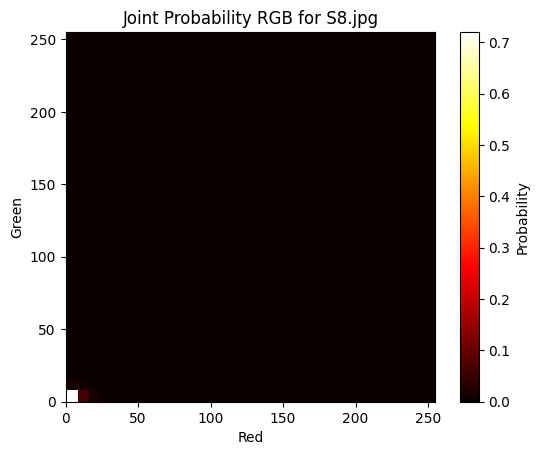

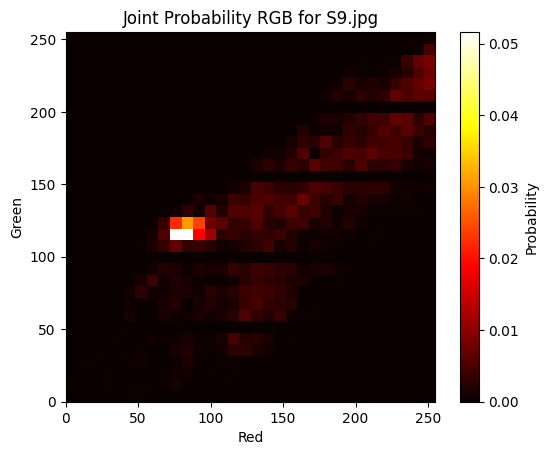

In [ ]:
import os
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

def resize_image(image, size=(50, 50)):
    return image.resize(size)

def downsample_rgb(rgb_data, bits_per_channel=5):
    scale = 255 // ((2 ** bits_per_channel) - 1)
    return (rgb_data // scale) * scale

def extract_rgb(image):
    return np.array(image).reshape(-1, 3)

def calculate_relative_frequency(data):
    unique, counts = np.unique(data, return_counts=True, axis=0)
    relative_freq = counts / np.sum(counts)
    return unique, relative_freq

def plot_joint_probability(unique, relative_freq, filename):
    x, y, z = unique[:, 0], unique[:, 1], unique[:, 2]

    # Create a 2D histogram of the joint probabilities
    hist, xedges, yedges = np.histogram2d(x, y, bins=(32, 32), weights=relative_freq)

    # Plot the heatmap
    fig, ax = plt.subplots()
    im = ax.imshow(hist.T, origin='lower', cmap='hot', interpolation='nearest', extent=[0, 255, 0, 255])
    ax.set_xlabel('Red')
    ax.set_ylabel('Green')
    ax.set_title(f'Joint Probability RGB for {filename}')
    cbar = plt.colorbar(im)
    cbar.set_label('Probability')

    plt.show()

def process_image_folder(folder_path):
    for filename in os.listdir(folder_path):
        if filename.endswith(".jpg") or filename.endswith(".png"):
            file_path = os.path.join(folder_path, filename)
            image = Image.open(file_path)
            resized_image = resize_image(image)
            rgb_data = extract_rgb(resized_image)
            downsampled_rgb_data = downsample_rgb(rgb_data, bits_per_channel=5)
            unique, relative_freq = calculate_relative_frequency(downsampled_rgb_data)
            plot_joint_probability(unique, relative_freq, filename)

# Provide the path to your image folder
image_folder = "/content/drive/MyDrive/Colab Notebooks/bunga"
process_image_folder(image_folder)
